In [275]:
# Run if using on google collab, change path accordingly
from google.colab import drive # type: ignore
drive.mount('/content/drive', force_remount=True)
path = '/content/drive/MyDrive/Colab Notebooks/ML - LGI/Project_Unsupervised/'

Mounted at /content/drive


In [ ]:
# run if running locally
path = ''

In [276]:
!pip install git+https://github.com/sevamoo/SOMPY.git #egg=SOMPY
!pip install scikit-image

  Cloning https://github.com/sevamoo/SOMPY.git to /tmp/pip-req-build-pyhvzggv
  Running command git clone --filter=blob:none --quiet https://github.com/sevamoo/SOMPY.git /tmp/pip-req-build-pyhvzggv
  Resolved https://github.com/sevamoo/SOMPY.git to commit 6aca604b06e5eea1391ecf507810c7aabafc3f8b
  Preparing metadata (setup.py) ... done


In [279]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import multiprocessing
import sompy
from sompy.sompy import SOMFactory

cpuc = multiprocessing.cpu_count()-1

#setting seaborn visual style in plt
sns.set_theme()

In [280]:
from tqdm import tqdm

# Integration & Exploration

In [281]:
# dataDF: pd.DataFrame = pd.read_excel(path + 'data/Descriptive_Data.xlsx')
# print(f"Duplicaded: {dataDF.duplicated().sum()}\nMissing: {dataDF.isna().sum().sum()}\nNon-Registered (empty): {(dataDF["Registered"] != "Yes").sum()}")

In [282]:
# import the data and drop remove useless stuff
dataDF: pd.DataFrame = pd.read_excel(path + 'data/Descriptive_Data.xlsx')
dataDF: pd.DataFrame = dataDF.set_index('Userid')
dfSuccess: pd.DataFrame = pd.read_excel(path+'data/Descriptive_Data.xlsx',sheet_name=1)
dfSuccess = dfSuccess.set_index('Userid')
dataDF = dataDF.join(dfSuccess, 'Userid')
dataDF = dataDF.drop('Observations', axis=1).drop_duplicates()
dataDF = dataDF[dataDF['Registered'] == 'Yes']
dataDF = dataDF.drop('Registered', axis=1)

In [283]:
metricFeatures: list[str] = ['Application order','Previous qualification score','Entry score','Age at enrollment','N units credited 1st period',
       'N units taken 1st period', 'N scored units 1st period',
       'N units approved 1st period', 'Average grade 1st period',
       'N unscored units 1st period', 'N units credited 2nd period',
       'N units taken 2nd period', 'N scored units 2nd period',
       'N units approved 2nd period', 'Average grade 2nd period',
       'N unscored units 2nd period','Social Popularity']
categoricalFeatures: list[str] =  ['Application mode','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation']
boolFeatures: list[str] = ['Morning shift participation','Displaced','Special needs','Debtor','Regularized Fees','Gender_Male','External Funding','International']

academicFeatures: list[str] = ['Previous qualification score','Entry score','N units taken 1st period', 'N scored units 1st period',
       'N units approved 1st period', 'Average grade 1st period',
       'N unscored units 1st period', 'N units credited 2nd period',
       'N units taken 2nd period', 'N scored units 2nd period',
       'N units approved 2nd period', 'Average grade 2nd period',
       'N unscored units 2nd period']
demographicFeatures: list[str] = ['Age at enrollment','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation','Special needs','International','Debtor','Regularized Fees','Gender_Male']

In [284]:
dataDF[metricFeatures].describe()

,Application order,Previous qualification score,Entry score,Age at enrollment,N units credited 1st period,N units taken 1st period,N scored units 1st period,N units approved 1st period,Average grade 1st period,N unscored units 1st period,N units credited 2nd period,N units taken 2nd period,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,Social Popularity
count,4336.000000,4424.000000,4424.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.000000,4424.000000,4336.00000,4336.000000,4336.000000,4336.000000,4336.000000,4424.000000,4336.00000,4424.000000
mean,1.727168,132.613314,126.978119,23.271679,0.711255,6.264991,8.297048,4.711716,10.640822,0.13953,0.547279,6.226937,8.060655,4.431734,10.230206,0.15060,49.416139
std,1.317108,13.188332,14.482001,7.593933,2.367723,2.477978,4.181946,3.101945,4.843663,0.69710,1.931605,2.197235,3.942173,2.996183,5.210808,0.75341,28.605659
min,0.000000,95.000000,95.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000
25%,1.000000,125.000000,117.900000,19.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.00000,0.000000,5.000000,6.000000,2.000000,10.750000,0.00000,25.000000
50%,1.000000,133.100000,126.100000,20.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.00000,0.000000,6.000000,8.000000,5.000000,12.200000,0.00000,49.000000
75%,2.000000,140.000000,134.800000,25.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.00000,0.000000,7.000000,10.000000,6.000000,13.333333,0.00000,74.000000
max,9.000000,190.000000,190.000000,70.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.00000,19.000000,23.000000,33.000000,20.000000,18.571429,12.00000,99.000000


In [285]:
for variable in categoricalFeatures:
  print(dataDF[variable].value_counts())

Application mode
1.0    1725
0.0    1640
2.0     850
3.0     121
Name: count, dtype: int64
Marital status
single               3919
married               379
divorced               91
facto union            25
legally separated       6
widower                 4
Name: count, dtype: int64
Course
Nursing                                 766
Management                              380
Social Service                          355
Veterinary Nursing                      337
Journalism and Communication            331
Management (evening attendance)         268
Advertising and Marketing Management    268
Tourism                                 252
Communication Design                    226
Animation and Multimedia Design         215
Social Service (evening attendance)     215
Agronomy                                210
Basic Education                         192
Informatics Engineering                 170
Equinculture                            141
Oral Hygiene                             86
B

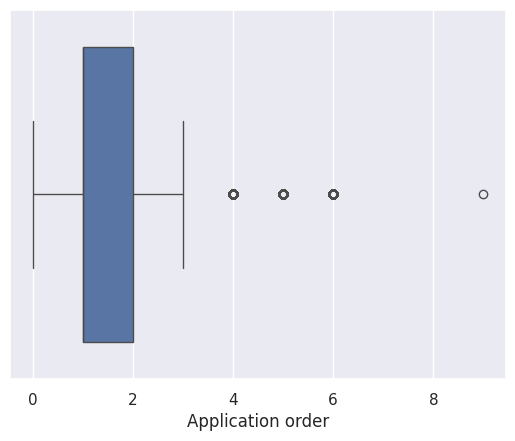

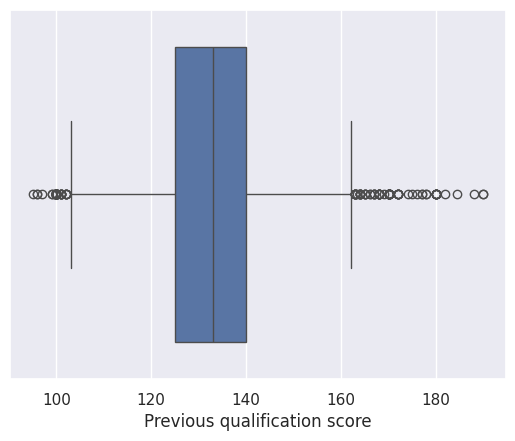

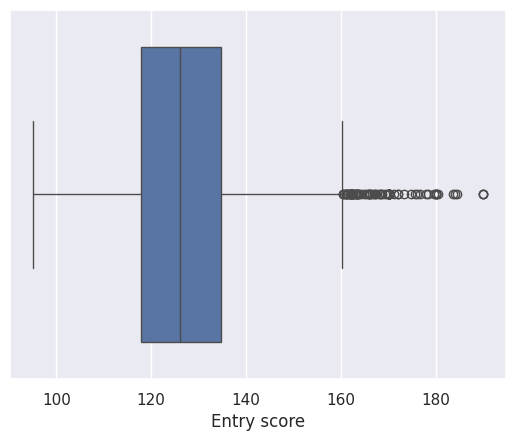

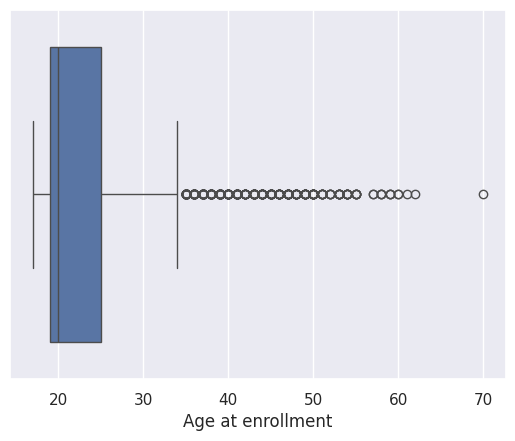

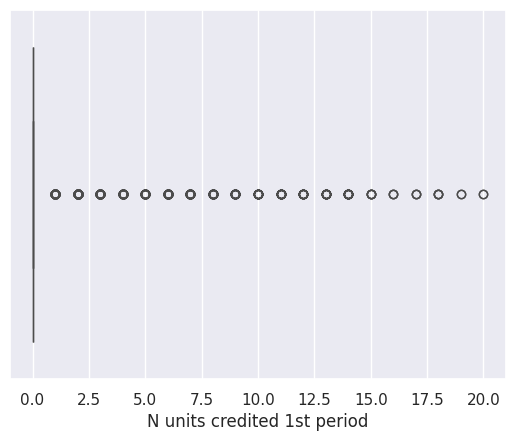

...

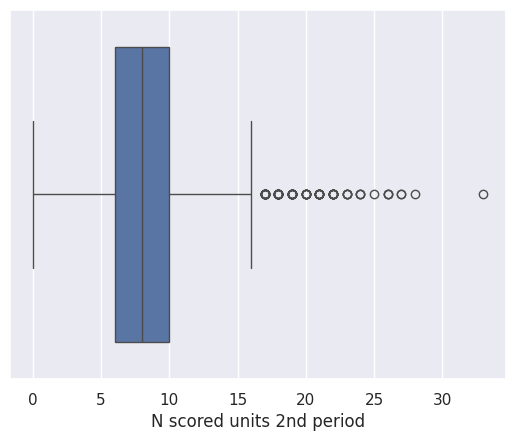

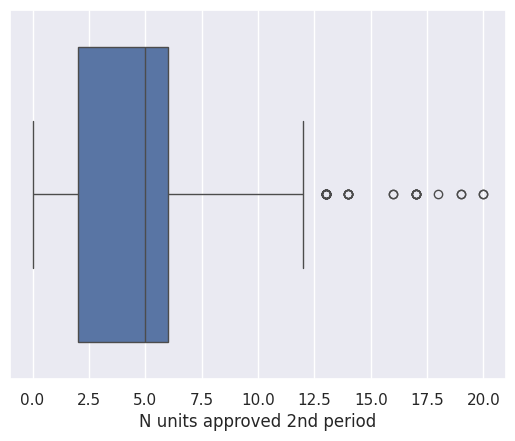

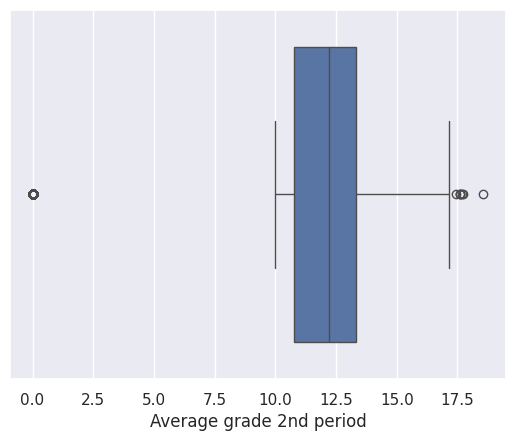

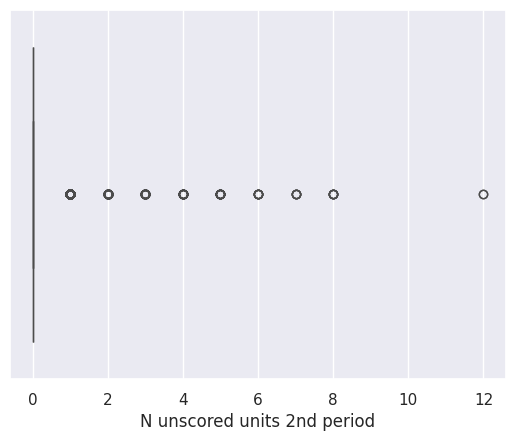

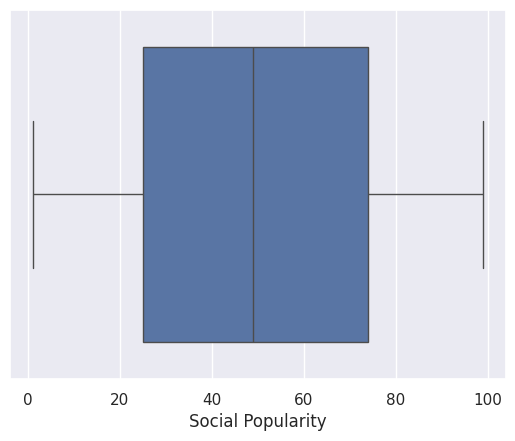

In [286]:
for i, col in enumerate(metricFeatures):
  plt.figure(i)
  sns.boxplot(x=col, data=dataDF)

In [287]:
# mn.matrix(data)

In [288]:
# percentage of empty values in a column
round(dataDF.isnull().sum() / dataDF.shape[0] * 100.00,2)

Marital status                  0.00
Application mode                1.99
Application order               1.99
Course                          0.00
Morning shift participation     1.99
Previous qualification          0.05
Previous qualification score    0.00
Nationality                     0.00
Mother's qualification          2.94
Father's qualification          2.62
Mother's occupation             0.38
Father's occupation             1.20
Entry score                     0.00
Displaced                       1.99
Special needs                   1.99
Debtor                          1.99
Regularized Fees                1.99
Gender_Male                     1.99
External Funding                1.99
Age at enrollment               1.99
International                   1.99
N units credited 1st period     1.99
N units taken 1st period        1.99
N scored units 1st period       1.99
N units approved 1st period     1.99
Average grade 1st period        0.00
N unscored units 1st period     1.99
N

# Preprocessing

In [289]:
def fillNa(data: pd.DataFrame) -> pd.DataFrame:
    """Fill missing values

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    # on all of these features, if a value were to be different than 0, then it would not be missing, eg units approved, if the student approved, the value wouldn't be missing
    ifNaThen0: tuple[str,...] = (
        "N units credited 1st period",
        "N unscored units 1st period",
        "N scored units 1st period",
        "N units credited 2nd period",
        "N unscored units 2nd period",
        "N scored units 2nd period"
    )

    # these features are filled differently, basically incoherence checking, but filling the Na on 'N units approved 1st/2nd period' is needed beforehand, more info below
    checkAfterVars: list[list[str]] = [
        ["N units taken 1st period", "N scored units 1st period"],
        ["N units taken 2nd period", "N scored units 2nd period"]
    ]

    for var in metricFeatures:
        if var == (checkAfterVars[0][0] or checkAfterVars[1][0]):
            continue # skip current iteration
        if var in ifNaThen0:
            data[var] = data[var].fillna(0) # fill the ifNaThen0 vars with well, 0s
        else:
            data[var] = data[var].fillna(data[var].median()) # fill everything else with the median of the values of the feature

    # here we use the n units taken features we skipped earlier, a student has to have taken at least the same number of courses as the number of courses they passed
    for varList in checkAfterVars:
        # search for Na values on N units taken and replace by the equivalent value on N units approved
        data.loc[data[varList[0]].isna(), varList[0]] = data[varList[1]]
        # search for values on N units taken that are smaller than the equivalent on N units approved, replace by the equivalent value on N units approved
        data.loc[data[varList[0]] < data[varList[1]], varList[0]] = data[varList[1]]

    for var in boolFeatures:
        if var == "Regularized Fees":
            data[var] = data[var].fillna(1) # if nothing is said about the fees, we can assume they have been paid
        else:
            data[var] = data[var].fillna(0) # here is like the ifNaThen0 situation, if the values were to not be 0, they would have been declared

    return data

In [290]:
def removeOutliers(data: pd.DataFrame) -> pd.DataFrame:
    """Removes outliers and fixes any negative number incoherences on the selected variables from the dataframe

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    toBeTreated: dict[str, dict[str, float | None]] = {
        "Application order": {"lower": 0, "upper": None},
        "Previous qualification score": {"lower": 0, "upper": None},
        "Entry score": {"lower": 0, "upper": None},
        "Age at enrollment": {"lower": 0, "upper": None},
        "N units credited 1st period": {"lower": 0, "upper": 15},
        "N units taken 1st period": {"lower": 0, "upper": 20},
        "N scored units 1st period": {"lower": 0, "upper": 25},
        "N units approved 1st period": {"lower": 0, "upper": 20},
        "Average grade 1st period": {"lower": 0, "upper": None},
        "N unscored units 1st period": {"lower": 0, "upper": None},
        "N units credited 2nd period": {"lower": 0, "upper": 14},
        "N units taken 2nd period": {"lower": 0, "upper": 15},
        "N scored units 2nd period": {"lower": 0, "upper": 25},
        "N units approved 2nd period": {"lower": 0, "upper": 15},
        "Average grade 2nd period": {"lower": 0, "upper": None},
        "N unscored units 2nd period": {"lower": 0, "upper": None},
        "Social Popularity": {"lower": 0, "upper": 100},
    }

    for var in toBeTreated:
        if toBeTreated[var]["lower"] != None:
            toRemove: list = list(data.loc[data[var] < toBeTreated[var]["lower"], var].index)
        if toBeTreated[var]["upper"] != None:
            toRemove.extend(list(data.loc[data[var] > toBeTreated[var]["upper"], var].index))
        data.drop(toRemove, axis=0, inplace=True)

    return data

In [291]:
def groupValues(data: pd.DataFrame) -> pd.DataFrame:
    """replace values on columns that have lots of different values that can be grouped together to reduce the total number of dummies created after

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    # for col in ["Mother's qualification",  "Father's qualification", "Previous qualification"]:
    #     data.replace(regex={col: {r"(?i)^no school.*$": '0',
    #                         r"(?i)^[0-4][a-z]{2} grade.*$": '1',
    #                         r"(?i)^[5-9]th grade.*$": '2',
    #                         r"(?i)^1[0-2]th grade.*$": '3',
    #                         r"(?i)^incomplete bachelor.*$": '4',
    #                         r"(?i)^bachelor degree.*$": '5',
    #                         r"(?i)^post-grad.*$": '6',
    #                         r"(?i)^master degree.*$": '7',
    #                         r"(?i)^phd.*$": '8',}}, inplace=True)
    education={
        '12th grade':'Middle',
        '9th grade':'Middle',
        '11th grade':'Middle',
        '12th grade - Technological specialization course':'Middle',
        '10th grade':'Middle',
        '12th grade - Technical-professional course':'Middle',
        '4th grade':'Lower',
        '6th grade':'Lower',
        '8th grade':'Lower',
        '3rd grade':'Lower',
        'Bachelor degree':'Higher',
        'Master degree':'Higher',
        'PhD':'Higher',
        'Post-Graduation':'Higher',
        'Incomplete Bachelor\'s':'Higher',
        'No School': 'None'
      }

    data['Father\'s qualification'].replace(education,inplace=True)
    data['Mother\'s qualification'].replace(education,inplace=True)

    for col in ["Mother's occupation", "Father's occupation"]:
          data.replace(to_replace={col: ["Superior-level Professional", "Intermediate-level Professional", "Politician/CEO", "Teacher", "Information Technology Specialist"]}, value="Professional Fields", inplace=True)
          data.replace(to_replace={col: ["Skilled construction workers", "Assembly Worker", "Factory worker", "Lab Technocian"]}, value="Technical and Skilled Trades", inplace=True)
          data.replace(to_replace={col: ["Administrative Staff", "Office worker", "Accounting operator"]}, value="White collar Jobs", inplace=True)
          data.replace(to_replace={col: ["Restaurant worker", "Personal care worker", "Seller", "Cleaning worker"]}, value="Service Industry", inplace=True)
          data.replace(to_replace={col: ["Private Security", "Armed Forces"]}, value="Security and Armed Forces", inplace=True)
          data.replace(to_replace={col: ["Unskilled Worker", "Other", "Student", "Artist"]}, value="Recreational or unskilled", inplace=True)
          data.replace(to_replace={col: ["Engineer", "Scientist", "Health professional"]}, value="STEM Jobs", inplace=True)

    data.replace(to_replace={"Marital status": {
        'single':'alone',
        'divorced':'alone',
        'legally separated':'alone',
        'widower':'alone',
        'married':'together',
        'facto union':'together'
    }}, inplace=True)

    return data

In [292]:
def getDummies(data: pd.DataFrame) -> pd.DataFrame:
    """get dummies

    Args:
        train (`pd.DataFrame`): Train dataframe to be treated

    Returns:
        `pd.DataFrame` : treated dataframe
    """

    data = pd.get_dummies(data=data, prefix_sep="-", dummy_na=True, drop_first=False)

    return data

In [293]:
def scaleData(data: pd.DataFrame) -> pd.DataFrame:
    """Tranforms the values in the dataframe to fit in a scale of 0 to 1

    Args:
        train (pd.DataFrame): Unscaled train dataframe

    Returns:
        pd.DataFrame: Scaled dataframe
    """

    scaler = MinMaxScaler()
    scaler.fit(data)

    data = pd.DataFrame(scaler.transform(data), columns = data.columns, index = data.index)

    return data

In [294]:
def encodeSuccess(successData: pd.DataFrame) -> pd.DataFrame:
    """Replace string values on success by integers

    Args:
        successData (pd.DataFrame): Untreated dataframe

    Returns:
        pd.DataFrame: Treated dataframe
    """
    successData.replace({'Success': {"Gave up": 0, "Holding on": 1, "Succeeded": 2}}, inplace=True)

    return successData

In [295]:
def prepData(data: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """Runs the preprocessing steps on the dataframe

    Args:
        data (pd.DataFrame): Un-preprocessed data dataframe

    Returns:
        pd.DataFrame: Treated dataframe
    """

    data = encodeSuccess(data)
    data = fillNa(data)
    data = removeOutliers(data)
    data = groupValues(data)
    dataAcademic: pd.DataFrame = data[academicFeatures]
    dataDemographic: pd.DataFrame = data[demographicFeatures]
    dataAcademic = getDummies(dataAcademic)
    dataDemographic = getDummies(dataDemographic)
    dataAcademic = scaleData(dataAcademic)
    dataDemographic = scaleData(dataDemographic)
    data = getDummies(data)
    data = scaleData(data)

    return data, dataAcademic, dataDemographic

# Feature Selection

In [ ]:
def pairPlots(data: pd.DataFrame,fileName: str) -> None:
    sns.pairplot(data.sample(1000)).savefig(f"./output/{fileName}.png")

# Feature engineering

In [296]:
def addAverages(data):
  data['Average grades']=(data['Average grade 1st period']+data['Average grade 2nd period'])/2
  data['Average units taken']=(data['N units taken 1st period']+data['N units taken 2nd period'])/2
  data['Average scored units']=(data['N scored units 1st period']+data['N scored units 2nd period'])/2
  data['Average units approved']=(data['N units approved 1st period']+data['N units approved 2nd period'])/2
  data['Average units credited']=(data['N units credited 1st period']+data['N units credited 2nd period'])/2
  data['Average unscored units']=(data['N unscored units 1st period']+data['N unscored units 2nd period'])/2

  data['Unit load']=data['N units credited 1st period']+data['N units credited 2nd period']

In [297]:
# data['Average grades']=(data['Average grade 1st period']+data['Average grade 2nd period'])/2
# data['Average units taken']=(data['N units taken 1st period']+data['N units taken 2nd period'])/2
# data['Average scored units']=(data['N scored units 1st period']+data['N scored units 2nd period'])/2
# data['Average units approved']=(data['N units approved 1st period']+data['N units approved 2nd period'])/2
# data['Average units credited']=(data['N units credited 1st period']+data['N units credited 2nd period'])/2
# data['Average unscored units']=(data['N unscored units 1st period']+data['N unscored units 2nd period'])/2

# data['Unit load']=data['N units credited 1st period']+data['N units credited 2nd period']

In [298]:
# dataDF['Average grades']=(dataDF['Average grade 1st period']+dataDF['Average grade 2nd period'])/2
# dataDF['Average units taken']=(dataDF['N units taken 1st period']+dataDF['N units taken 2nd period'])/2
# dataDF['Average scored units']=(dataDF['N scored units 1st period']+dataDF['N scored units 2nd period'])/2
# dataDF['Average units approved']=(dataDF['N units approved 1st period']+dataDF['N units approved 2nd period'])/2
# dataDF['Average units credited']=(dataDF['N units credited 1st period']+dataDF['N units credited 2nd period'])/2
# dataDF['Average unscored units']=(dataDF['N unscored units 1st period']+dataDF['N unscored units 2nd period'])/2

# dataDF['Unit load']=dataDF['N units credited 1st period']+dataDF['N units credited 2nd period']

# Clustering

In [299]:
def getSom(data) -> tuple[sompy.sompy.SOM, int, int, np.float32]:
    """_summary_

    Args:
        data (_type_): _description_

    Returns:
        tuple[sompy.sompy.SOM, int, int, np.float32]: _description_
    """
    df_som = np.float32(data.values)
    rows = 25
    cols = 25
    mapsize: list[int] = [rows, cols]

    som: sompy.sompy.SOM = SOMFactory().build(df_som, mapsize, mask=None,
                            mapshape='planar', # 2Dimensions
                            lattice='rect', # topology: 'rect' or 'hexa'
                            normalization='var', # standardize the variables
                            initialization='pca', # initialization of the weights: 'pca' or 'random'
                            neighborhood='gaussian', # neighborhood function: 'gaussian' or 'bubble'
                            training='batch') # training mode: 'seq' or 'batch'

    return som,rows,cols,df_som

In [300]:
def getGraphs(data: pd.DataFrame, somDetails: tuple[sompy.sompy.SOM, int, int, np.float32],nClusters) -> None:
    """_summary_

    Args:
        data (pd.DataFrame): _description_
        somDetails (tuple[sompy.sompy.SOM, int, int, np.float32]): _description_
    """
    somDetails[0].train(n_job=1, verbose=None, train_rough_len=3, train_finetune_len=5)

    u = sompy.umatrix.UMatrixView(somDetails[1], height=somDetails[2], title='U-matrix', show_axis=True, text_size=8, show_text=True)

    #This is the Umat value
    UMAT  = u.build_u_matrix(somDetails[0], distance=1, row_normalized=False)

    #Here you have Umatrix plus its render
    _, umat = u.show(somDetails[0], distance=1, row_normalized=True, contour=True, blob=False)

    somDetails[0].component_names = data.columns
    comp_planes = sompy.mapview.View2DPacked(somDetails[1], somDetails[2], 'Component Planes', text_size=8)
    comp_planes.show(somDetails[0], what='codebook', which_dim='all', col_sz=8)

    cl=somDetails[0].cluster(n_clusters=nClusters)
    labels = getattr(somDetails[0], 'cluster_labels')
    h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
    h.show(somDetails[0])
    bmus = somDetails[0].project_data(somDetails[3])
    data['bmu'] = bmus
    data['label'] = labels[data['bmu']]

    # clusteringResult: pd.DataFrame = data.groupby(['label']).describe().T
    return data

In [301]:
def clustering(data: pd.DataFrame, somDetails: tuple[sompy.sompy.SOM, int, int, np.float32], nClusters: int = 4) -> pd.DataFrame:
    """_summary_

    Args:
        data (pd.DataFrame): _description_
        somDetails (tuple[sompy.sompy.SOM, int, int, np.float32]): _description_
        clusters (int, optional): _description_. Defaults to 4.
    """
    somDetails[0].cluster(n_clusters=nClusters)
    labels = getattr(somDetails[0], 'cluster_labels')
    h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
    h.show(somDetails[0])
    bmus = somDetails[0].project_data(somDetails[3])
    data['bmu'] = bmus
    data['label'] = labels[data['bmu']]

    clusteringResult: pd.DataFrame = data.groupby(['label']).describe().T

    return clusteringResult

In [302]:
def somWrap(data, getClusters: bool = True, nClusters: int = 4) -> pd.DataFrame | None:
    somDetails: tuple[sompy.sompy.SOM, int, int, np.float32] = getSom(data)
    return getGraphs(data, somDetails,nClusters)
    # if getClusters:
    #     return clustering(data, somDetails, nClusters)

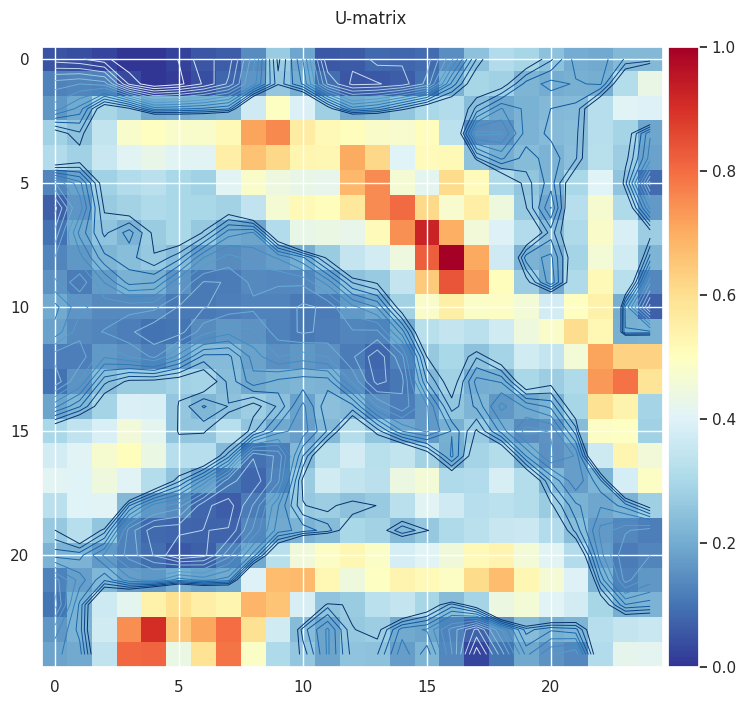

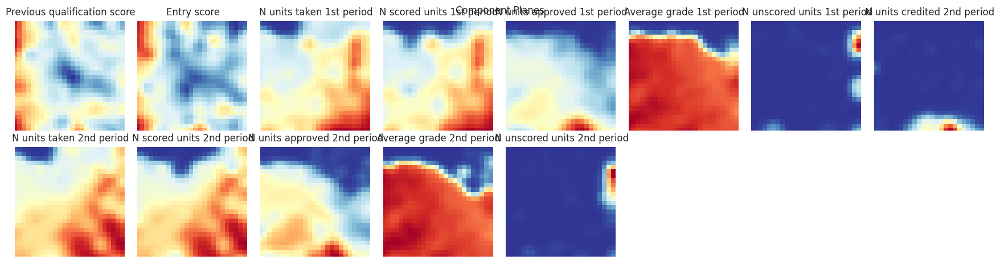

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,Previous qualification score,Entry score,N units taken 1st period,N scored units 1st period,N units approved 1st period,Average grade 1st period,N unscored units 1st period,N units credited 2nd period,N units taken 2nd period,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,bmu,label
Userid,,,,,,,,,,,,,,,
699,0.473684,0.473684,0.60,0.60,0.277778,0.667550,0.000,0.000000,0.733333,0.733333,0.428571,0.630769,0.000000,518,0
456,0.368421,0.208421,0.45,0.45,0.333333,0.591611,0.000,0.076923,1.000000,1.000000,0.142857,0.592308,0.083333,446,0
647,0.421053,0.273684,0.55,0.55,0.277778,0.593377,0.000,0.000000,1.000000,1.000000,0.071429,0.538462,0.000000,472,0
383,0.421053,0.273684,0.65,0.65,0.166667,0.547461,0.000,0.000000,0.800000,0.800000,0.214286,0.556410,0.000000,474,0
1217,0.305263,0.238947,0.50,0.50,0.277778,0.635762,0.000,0.000000,0.733333,0.733333,0.357143,0.646154,0.000000,392,0
669,0.557895,0.370526,0.35,0.00,0.000000,0.000000,0.000,0.000000,0.533333,0.000000,0.000000,0.000000,0.000000,12,1
2801,0.526316,0.420000,0.30,0.30,0.333333,0.821192,0.000,0.000000,0.400000,0.400000,0.428571,0.861538,0.000000,300,2
3145,0.736842,0.604211,0.40,0.40,0.333333,0.821192,0.000,0.000000,0.466667,0.466667,0.428571,0.769231,0.000000,550,2
336,0.473684,0.505263,0.30,0.30,0.333333,0.706402,0.000,0.153846,0.400000,0.400000,0.428571,0.789744,0.000000,250,2


In [303]:
somWrap(prepData(dataDF)[1],getClusters=True,nClusters=3)

# Model

In [304]:
def runAll(data: pd.DataFrame, getPairPlot: bool = False, getClusters: bool = True, nClusters: int = 4) -> None:
    """Runs the algorithm

    Args:
        X_train (pd.DataFrame): Raw/Un-preprocessed X_train dataframe
        Y_train (pd.DataFrame): Raw/Un-preprocessed Y_train dataframe
        X_test (pd.DataFrame): Raw/Un-preprocessed X_test dataframe
        split (bool, optional): Whether or not to split the dataframes using train_test_split, used for model assessment. Defaults to False.
    """

    dataDF, dataAcademic, dataDemographic = prepData(data)

    if getPairPlot:
        pairPlots(dataAcademic, "AcademicPairPlot")
        pairPlots(dataDemographic, "DemographicPairPlot")

    somWrap(dataAcademic, getClusters, nClusters)
    somWrap(dataDemographic, getClusters, nClusters)

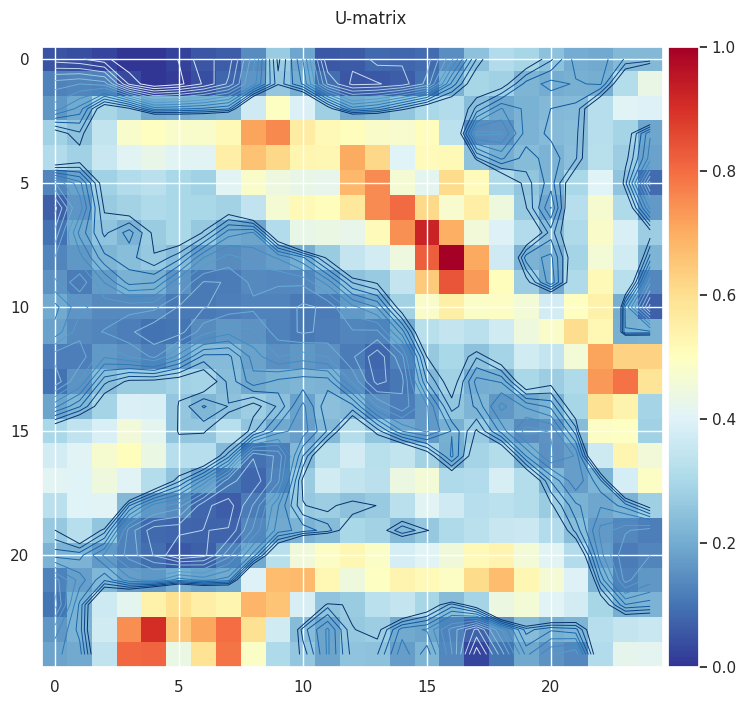

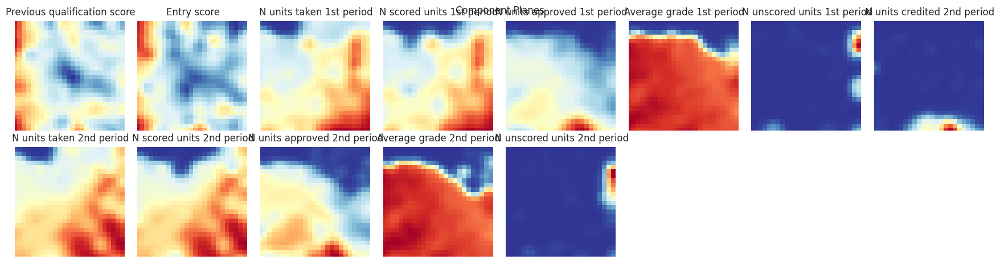

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


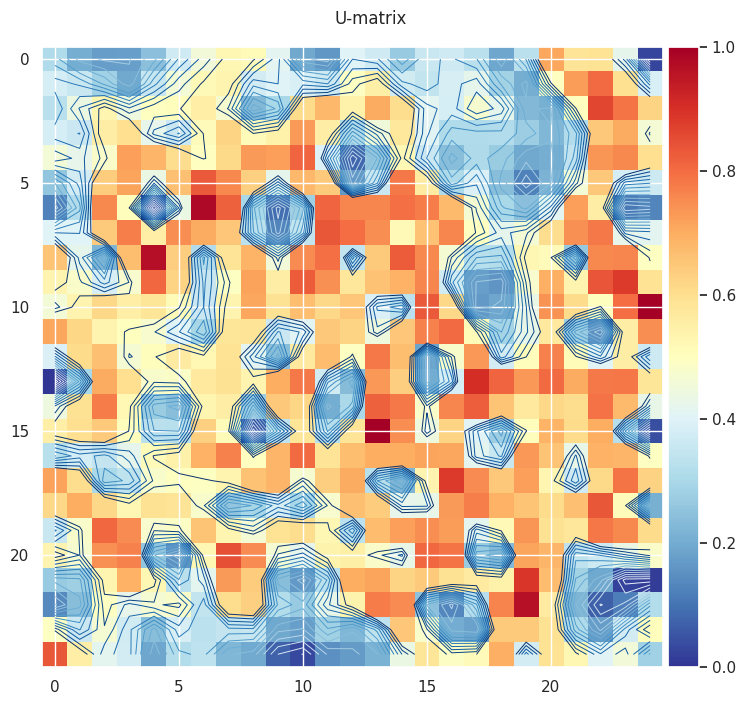

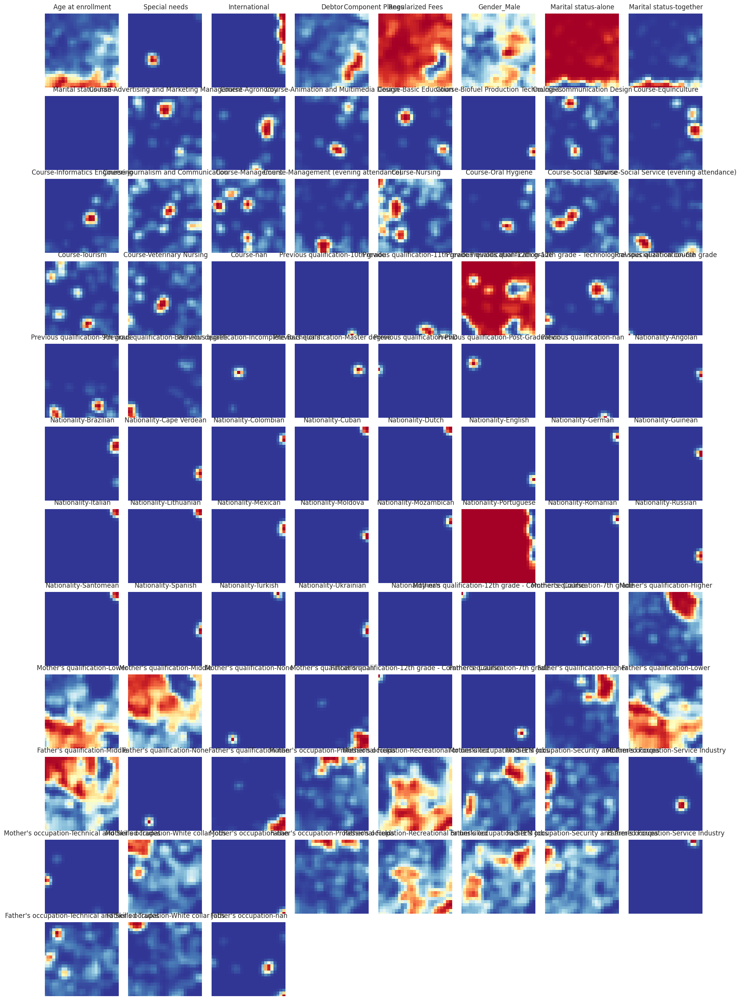

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [305]:
runAll(dataDF)

In [306]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        color = sns.color_palette('Dark2')

        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=color, ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=16, fontweight = 'heavy')
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=16)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=16)


    plt.subplots_adjust(hspace=0.4, top=0.90, bottom = 0.2)
    plt.suptitle("Cluster Profiling", fontsize=23)
    plt.show()

# SOM function

In [307]:
def somFunc(df_som,rows,cols,umat=False,componentPlanes=False,componentColumns=[]):
  mapsize=[rows,cols]
  som = SOMFactory().build(df_som, mapsize, mask=None,
                         mapshape='planar', # 2Dimensions
                         lattice='rect', # topology: 'rect' or 'hexa'
                         normalization='var', # standardize the variables
                         initialization='pca', # initialization of the weights: 'pca' or 'random'
                         neighborhood='gaussian', # neighborhood function: 'gaussian' or 'bubble'
                         training='batch') # training mode: 'seq' or 'batch'
  som.train(n_job=1, verbose=False, train_rough_len=3, train_finetune_len=5)

  if umat == True:
    u = sompy.umatrix.UMatrixView(rows, cols, title='U-matrix', show_axis=True, text_size=8, show_text=True)

  #This is the Umat value
  UMAT  = u.build_u_matrix(som, distance=1, row_normalized=False)

  #Here you have Umatrix plus its render
  _, umat = u.show(som, distance=1, row_normalized=True, contour=True, blob=False)

  if componentPlanes == True:
    som.component_names = componentColumns
    comp_planes = sompy.mapview.View2DPacked(rows, cols, 'Component Planes', text_size=8)
    comp_planes.show(som, what='codebook', which_dim='all', col_sz=8)

  return som

#AcademData

In [308]:
addAverages(dataDF)

In [309]:
academicData=['Entry score','Average scored units','Average grades','Average units taken','Average units approved','Average units credited','Average unscored units','Success']

In [310]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataAcademicDF = data[academicData]
dataAcademic = getDummies(dataAcademicDF)
dataAcademic = scaleData(dataAcademicDF)
data = getDummies(data)
data = scaleData(data)
dataAcademicDF=scaleData(dataAcademicDF)

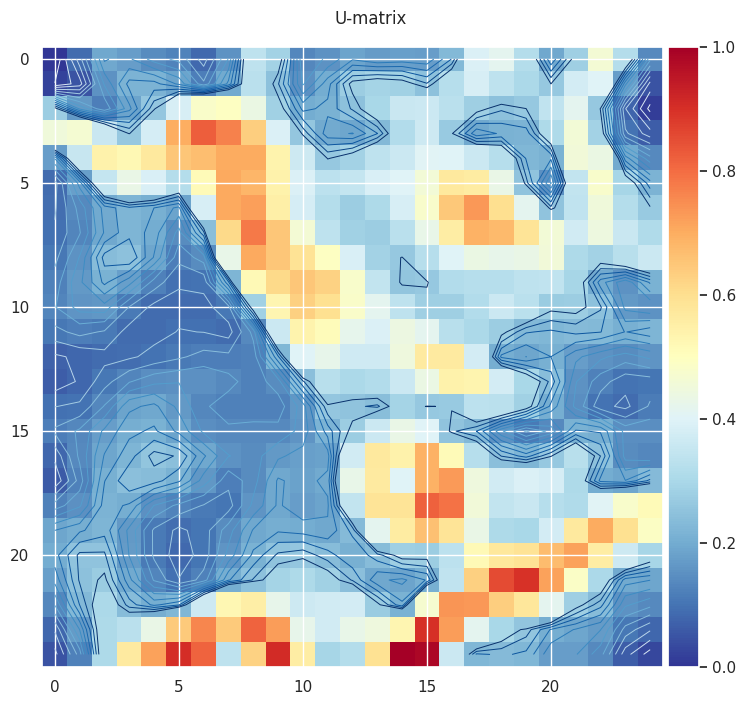

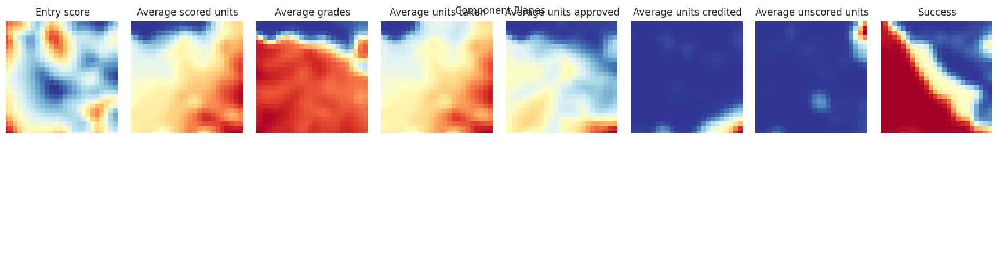

In [311]:
som=somFunc(np.float32(dataAcademicDF),25,25,True,True,dataAcademicDF.columns)

In [312]:
# cl = som.cluster(n_clusters=4)
bmus = som.project_data(dataAcademic)
som.cluster(n_clusters=3)
labels = getattr(som, 'cluster_labels')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


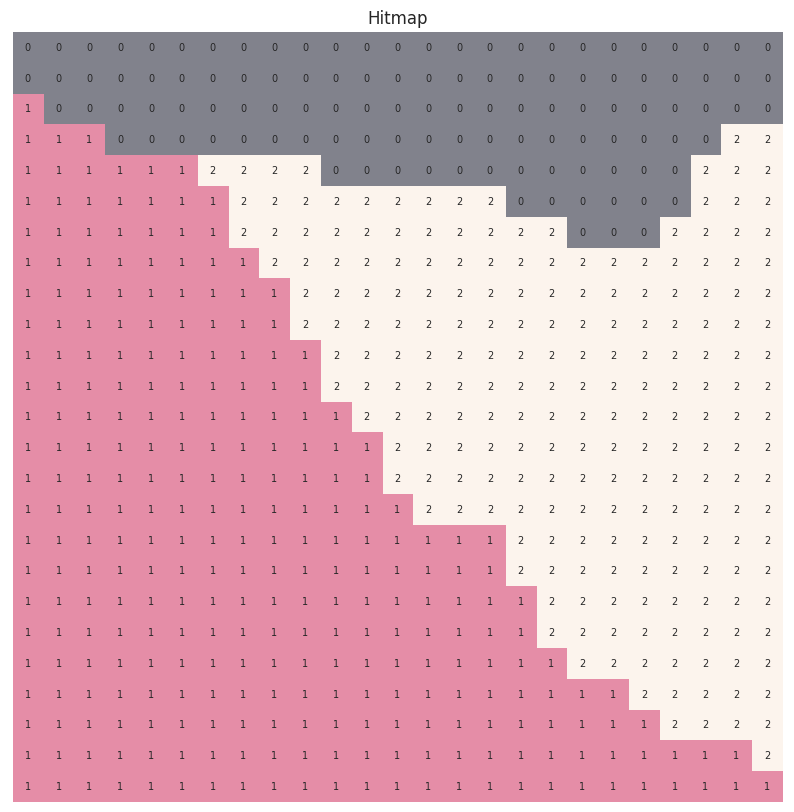

In [313]:
h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
h.show(som)

In [314]:
dataAcademicDF['bmu'] = bmus
dataAcademicDF['label'] = labels[dataAcademicDF['bmu']]

academicResults=dataDF.copy(deep=True)
academicResults['label']=dataAcademicDF['label']

<ipython-input-306-8dc2189a8ab8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


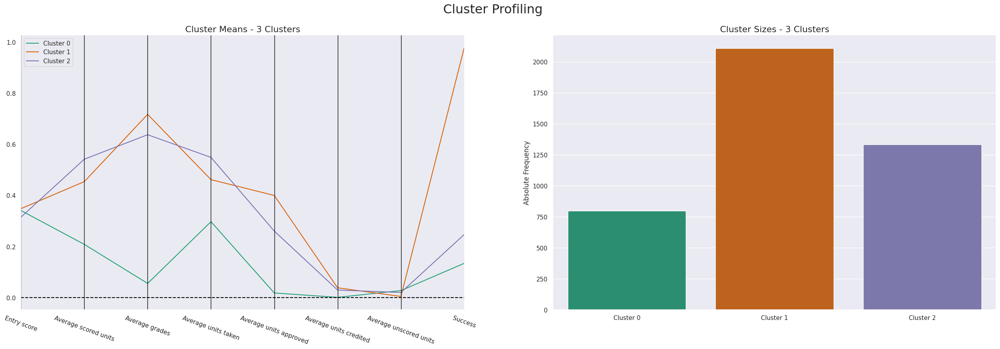

In [315]:
cluster_profiles(dataAcademicDF[academicData].join(dataAcademicDF['label']),["label"],figsize=(32, 10))

  0%|          | 0/8 [00:00<?, ?it/s]

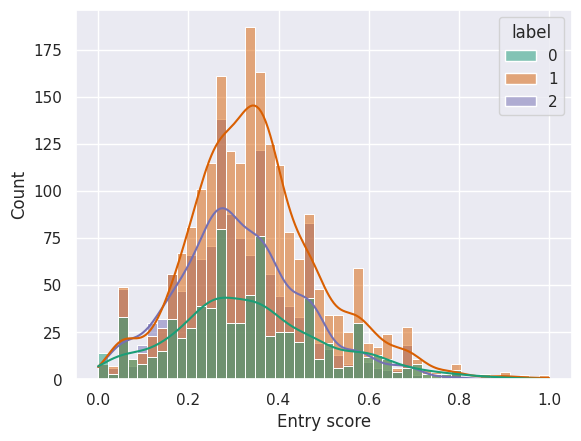

 12%|█▎        | 1/8 [00:00<00:04,  1.42it/s]

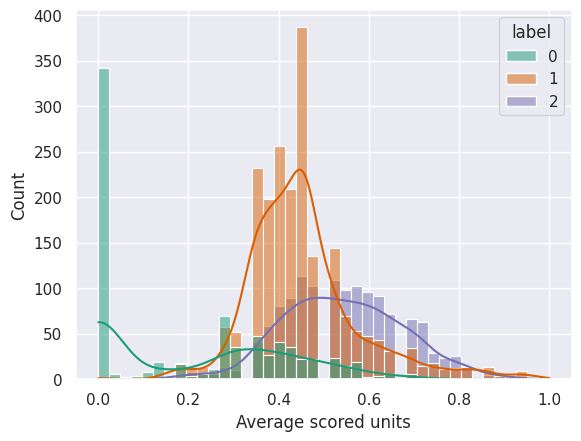

 25%|██▌       | 2/8 [00:01<00:04,  1.46it/s]

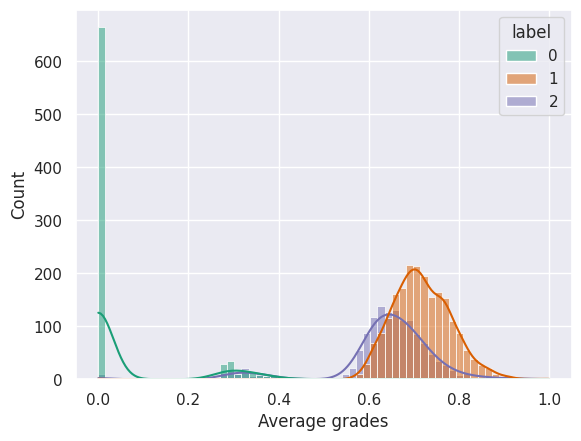

 38%|███▊      | 3/8 [00:02<00:05,  1.08s/it]

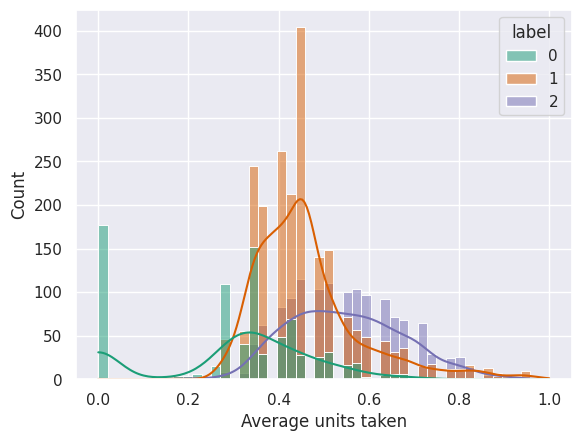

 50%|█████     | 4/8 [00:03<00:03,  1.03it/s]

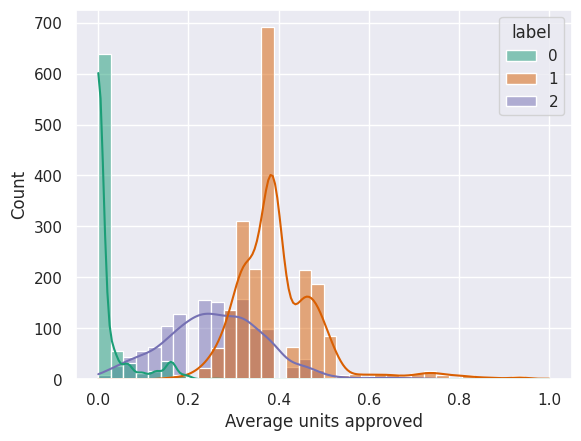

 62%|██████▎   | 5/8 [00:04<00:02,  1.11it/s]

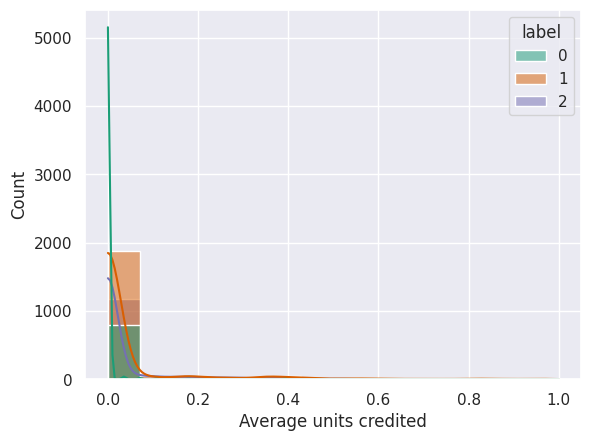

 75%|███████▌  | 6/8 [00:05<00:01,  1.20it/s]

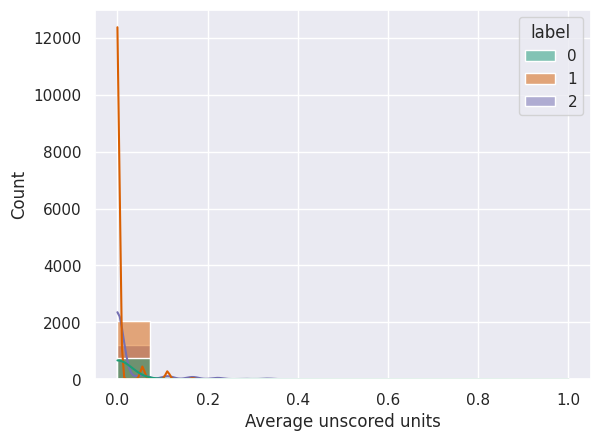

 88%|████████▊ | 7/8 [00:05<00:00,  1.25it/s]

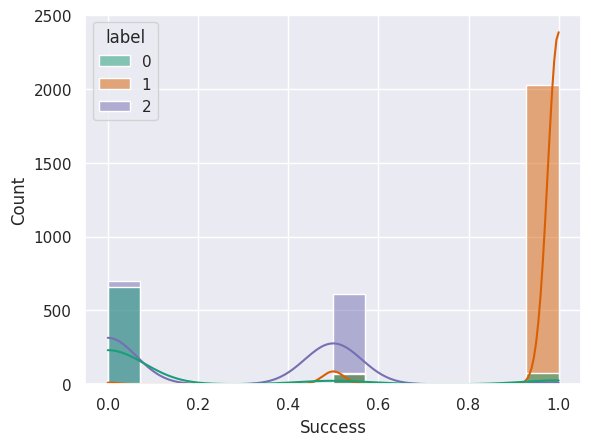

100%|██████████| 8/8 [00:06<00:00,  1.20it/s]


In [316]:
for i in tqdm(dataAcademicDF[academicData].columns):
    sns.histplot(dataAcademicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [317]:
academicData.remove('Average unscored units')
academicData.remove('Average units credited')

In [318]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataAcademicDF = data[academicData]
dataAcademic = getDummies(dataAcademicDF)
dataAcademic = scaleData(dataAcademicDF)
data = getDummies(data)
data = scaleData(data)
dataAcademicDF=scaleData(dataAcademicDF)

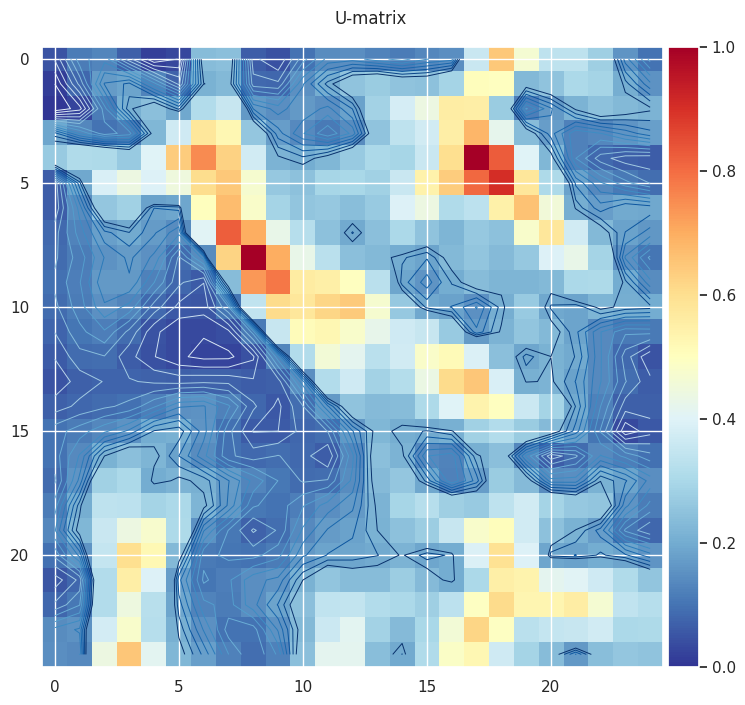

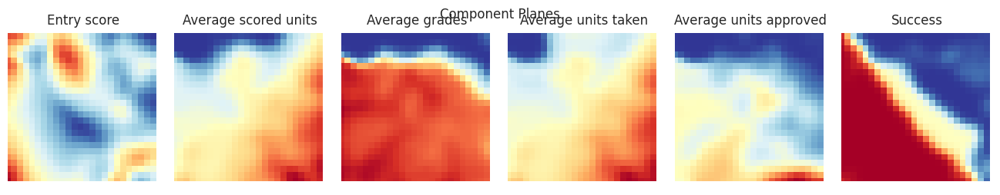

In [319]:
som=somFunc(np.float32(dataAcademicDF),25,25,True,True,dataAcademicDF.columns)

In [320]:
dataAcademicDF['bmu'] = bmus
dataAcademicDF['label'] = labels[dataAcademicDF['bmu']]

academicResults=dataDF.copy(deep=True)
academicResults['label']=dataAcademicDF['label']

<ipython-input-306-8dc2189a8ab8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


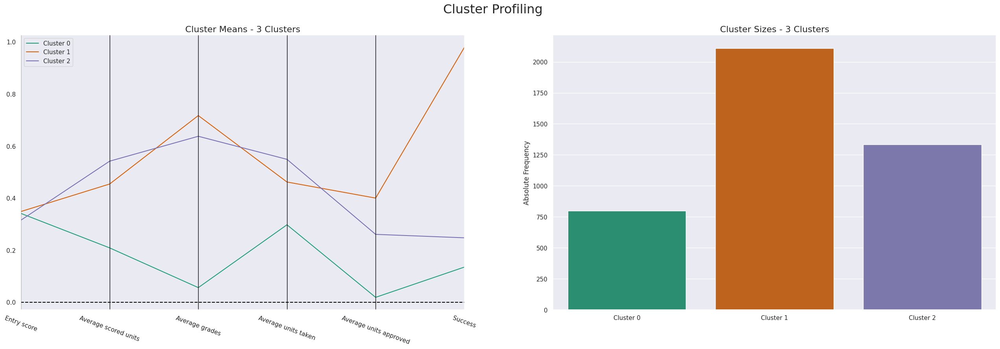

In [321]:
cluster_profiles(dataAcademicDF[academicData].join(dataAcademicDF['label']),["label"],figsize=(32, 10))

  0%|          | 0/6 [00:00<?, ?it/s]

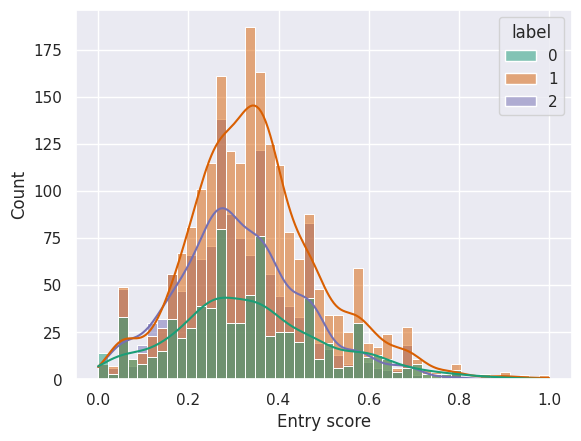

 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]

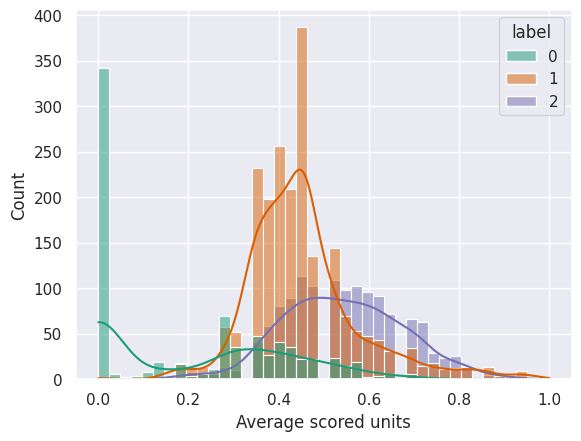

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

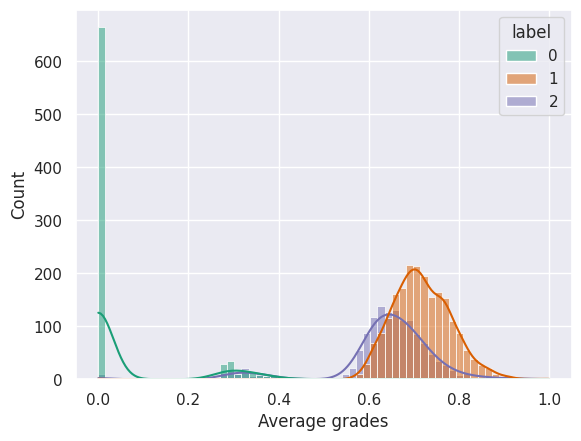

 50%|█████     | 3/6 [00:02<00:02,  1.41it/s]

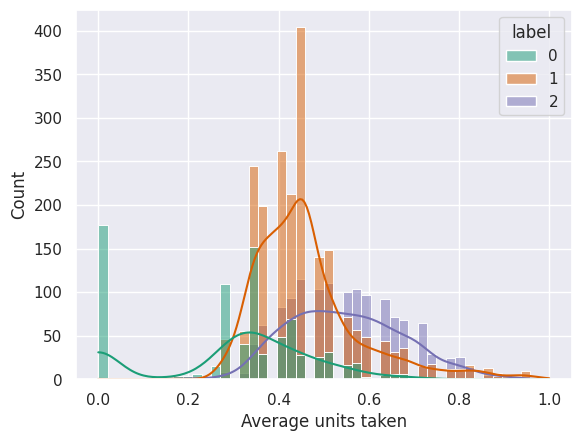

 67%|██████▋   | 4/6 [00:02<00:01,  1.42it/s]

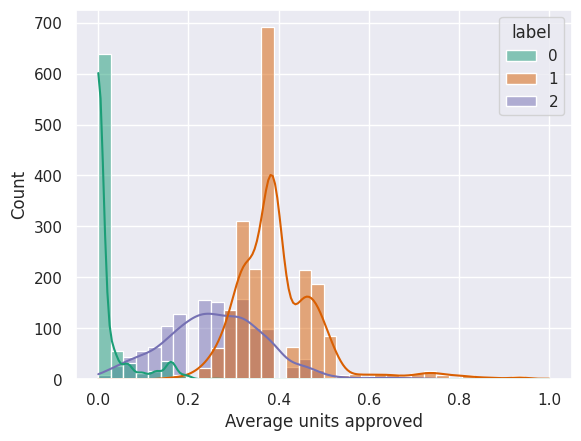

 83%|████████▎ | 5/6 [00:03<00:00,  1.18it/s]

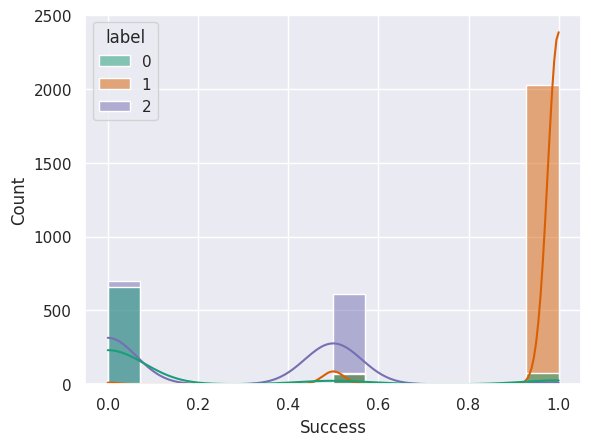

100%|██████████| 6/6 [00:04<00:00,  1.38it/s]


In [322]:
for i in tqdm(dataAcademicDF[academicData].columns):
    sns.histplot(dataAcademicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [323]:
academicResults[academicData+['label']].groupby(['label']).describe().T

label                                  0            1            2
Entry score            count  799.000000  2111.000000  1335.000000
                       mean   127.372841   128.076741   124.930337
                       std     16.517472    14.026042    13.555729
                       min     95.000000    95.000000    95.000000
                       25%    116.950000   119.200000   116.150000
                       50%    126.100000   127.000000   123.500000
                       75%    137.550000   135.450000   132.450000
                       max    183.500000   190.000000   190.000000
Average scored units   count  799.000000  2111.000000  1335.000000
                       mean     3.647059     7.941971     9.477528
                       std      3.634624     2.204223     2.350050
                       min      0.000000     0.000000     0.000000
                       25%      0.000000     6.500000     8.000000
                       50%      3.500000     7.500000     9.500000
                       75%      6.500000     8.500000    11.000000
                       max     12.500000    17.500000    16.500000
Average grades         count  799.000000  2111.000000  1335.000000
                       mean     1.019569    13.105347    11.650898
                       std      2.332589     1.242765     2.154187
                       min      0.000000     0.000000     0.000000
                       25%      0.000000    12.300000    11.184524
                       50%      0.000000    13.011905    11.900000
                       75%      0.000000    13.916667    12.750000
                       max     13.670000    18.283654    17.166667
Average units taken    count  799.000000  2111.000000  1335.000000
                       mean     5.200250     8.076978     9.600749
                       std      3.174925     2.092046     2.217249
                       min      0.000000     0.000000     3.000000
                       25%      4.500000     6.500000     8.000000
                       50%      6.000000     8.000000     9.500000
                       75%      7.500000     9.000000    11.000000
                       max     12.500000    17.500000    16.500000
Average units approved count  799.000000  2111.000000  1335.000000
                       mean     0.285982     6.195879     4.036330
                       std      0.695405     1.584171     1.744876
                       min      0.000000     0.000000     0.000000
                       25%      0.000000     5.000000     3.000000
                       50%      0.000000     6.000000     4.000000
                       75%      0.000000     7.000000     5.000000
                       max      4.000000    15.500000    11.500000
Success                count  799.000000  2111.000000  1335.000000
                       mean     0.269086     1.956419     0.494382
                       std      0.618376     0.224126     0.533515
                       min      0.000000     0.000000     0.000000
                       25%      0.000000     2.000000     0.000000
                       50%      0.000000     2.000000     0.000000
                       75%      0.000000     2.000000     1.000000
                       max      2.000000     2.000000     2.000000

# Demographic K means

In [324]:
# demographicData=['Mother\'s qualification','Father\'s qualification']
# demographicData=['Mother\'s occupation','Father\'s occupation']
# demographicData=['Age at enrollment','Marital status','Special needs']
demographicData: list[str] = ['Age at enrollment','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation','Special needs','International','Debtor','Regularized Fees','Gender_Male']


In [325]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataDFGrouped=removeOutliers(dataDF)
dataDFGrouped=groupValues(dataDFGrouped)
dataDemographicDF = data[demographicData]
dataDemographicDF = getDummies(dataDemographicDF)
dataDemographicDF = scaleData(dataDemographicDF)
data = getDummies(data)
data = scaleData(data)

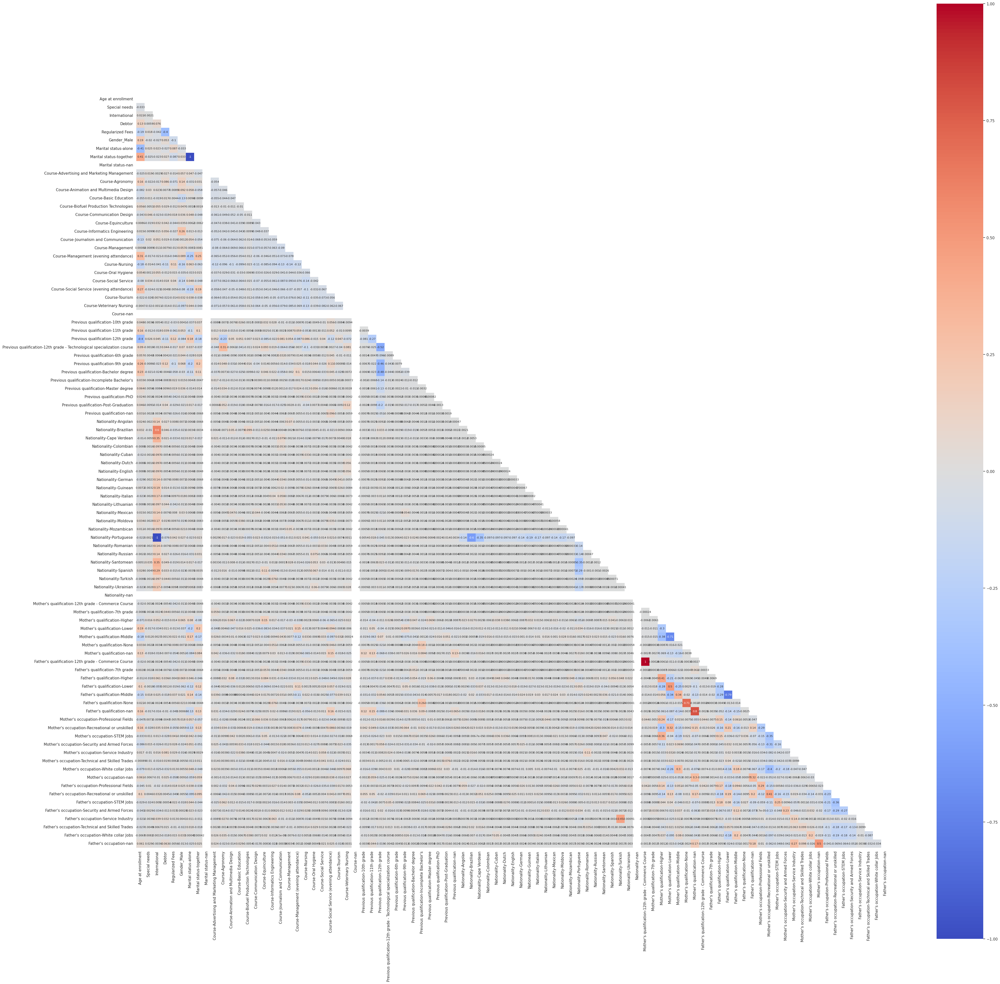

In [326]:
mask = np.zeros_like(dataDemographicDF.corr("spearman"))
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(50,50))
    ax = sns.heatmap(dataDemographicDF.corr("spearman"),mask=mask, annot = True,cmap='coolwarm',square=True,vmin=-1, vmax=1)

In [327]:
cor_spearman = dataDemographicDF[dataDemographicDF.columns].corr(method='spearman')
cor_spearman

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
# display only highly correlated (>=90%) features
threshold=0.8

mask = cor_spearman.abs() > threshold

high_cor = cor_spearman[mask].stack().reset_index()
high_cor.columns = ['Feature 1', 'Feature 2', 'Correlation']

# filter out where Feature1==Feature2
mask = high_cor['Feature 1'] == high_cor['Feature 2']
high_cor_filtered = high_cor[~mask]

high_cor_filtered

,Feature 1,Feature 2,Correlation
3,International,Nationality-Portuguese,-1.000000
8,Marital status-alone,Marital status-together,-1.000000
9,Marital status-together,Marital status-alone,-1.000000
54,Nationality-Portuguese,International,-1.000000
63,Mother's qualification-12th grade - Commerce C...,Father's qualification-12th grade - Commerce C...,1.000000
70,Mother's qualification-nan,Father's qualification-nan,0.802756
71,Father's qualification-12th grade - Commerce C...,Mother's qualification-12th grade - Commerce C...,1.000000
78,Father's qualification-nan,Mother's qualification-nan,0.802756


In [328]:
toRemove=['Nationality-Portuguese','Marital status-together','Mother\'s qualification-12th grade - Commerce Course','Mother\'s qualification-nan']

In [329]:
dataDemographicDF.drop(toRemove,axis=1,inplace=True)
toRemove=[]

In [330]:
from sklearn.cluster import KMeans

In [331]:
#setting range for possible values o k - 1 to 12
ks = range(1, 20)
inertias = [] #Creating pretty list to store results in

for k in tqdm(ks):
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(dataDemographicDF)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

  0%|          | 0/19 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  5%|▌         | 1/19 [00:00<00:09,  1.86it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 11%|█         | 2/19 [00:01<00:11,  1.42it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 16%|█▌        | 3/19 [00:03<00:20,  1.31s/it]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will cha

### elbow

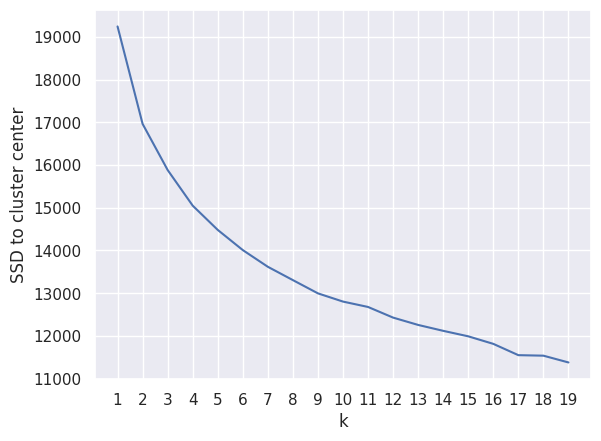

In [332]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot().
plt.plot(ks, inertias)

# define the label for x axis as 'k'
plt.xlabel('k')
# define the label for y axis as 'SSD'
plt.ylabel('SSD to cluster center')
# define the ticks in x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

### Silhuette score

In [333]:
from sklearn.metrics import silhouette_score

##setting range for possible values o k - 2 to 12
ks = range(2, 21)
sil_score = [] #Creating pretty list to store results in

for k in tqdm(ks):
#    # Create a KMeans instance with k clusters: model
   model = KMeans(n_clusters=k)

#    # Fit model to samples
   model.fit_predict(dataDemographicDF)

#    # Calculate Silhoutte Score
   sil_score.append(silhouette_score(dataDemographicDF, model.labels_, metric='euclidean'))

  0%|          | 0/19 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  5%|▌         | 1/19 [00:01<00:25,  1.39s/it]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 11%|█         | 2/19 [00:03<00:27,  1.60s/it]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 16%|█▌        | 3/19 [00:05<00:33,  2.06s/it]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will cha

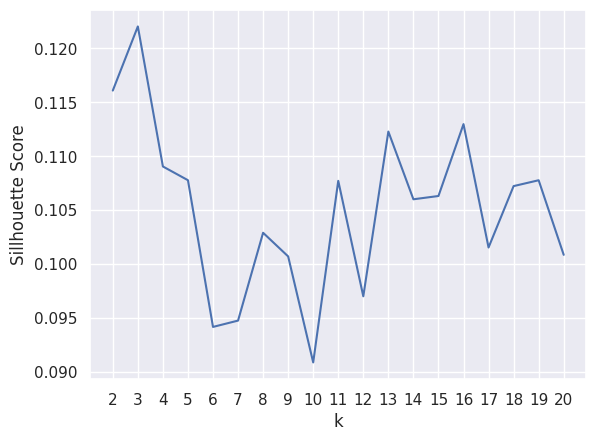

In [334]:
plt.plot(ks, sil_score)

## define the label for x axis as 'k'
plt.xlabel('k')
## define the label for y axis as 'Silhouette Score'
plt.ylabel('Sillhouette Score')
## define the ticks in x axis using the values of ks
plt.xticks(ks)
## call plt.show()
plt.show()

### Hierarchical

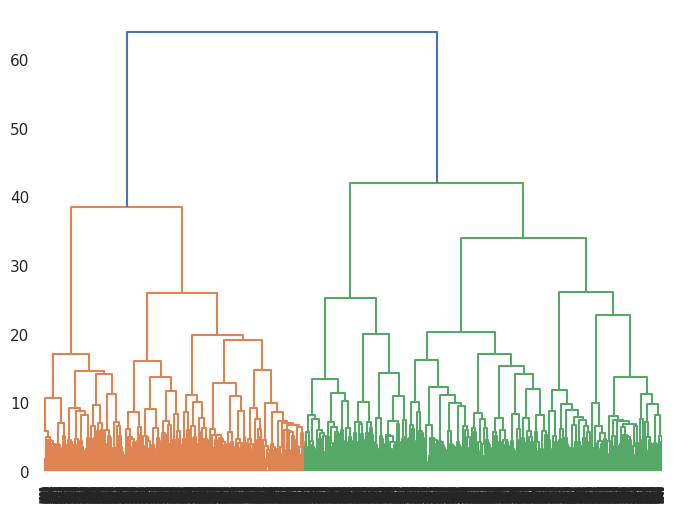

In [335]:
from scipy.cluster import hierarchy
##from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

## create clusters using the "ward method"
clusters = hierarchy.linkage(dataDemographicDF, method="ward")

## create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)
plt.show()
#plt.savefig("images/Hierarchical_results_artist_perspective.png", dpi=300)

In [336]:
kmeans_2 = KMeans(n_clusters = 3, random_state = 100).fit(dataDemographicDF)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [337]:
dataDemographicDF['label'] = kmeans_2.predict(dataDemographicDF)

<ipython-input-306-8dc2189a8ab8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


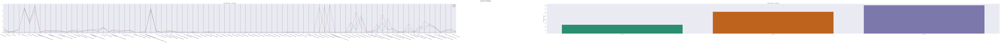

In [338]:
#profiling the cluster with the function
cluster_profiles(dataDemographicDF, ["label"], figsize=(300, 10))

Many of the features have a low variability between clusters, so will be removed

### Removing low variance features

In [339]:
nationality = [s for s in dataDemographicDF.columns if s.startswith("Nationality")]
course=[s for s in dataDemographicDF.columns if s.startswith("Course")]
prevQual=[s for s in dataDemographicDF.columns if s.startswith("Previous qualification")]


In [340]:
toRemove=['Special needs','International','Debtor','Regularized Fees','Marital status-nan',
          'Father\'s qualification-7th grade','Father\'s qualification-7th grade',
          'Father\'s qualification-None','Mother\'s occupation-Service Industry',
          'Mother\'s occupation-White collar Jobs','Father\'s occupation-Professional Fields',
          'Father\'s occupation-Service Industry','Father\'s occupation-Technical and Skilled Trades',
          'Father\'s occupation-White collar Jobs','Father\'s occupation-nan',
          'Mother\'s qualification-7th grade','Mother\'s qualification-None',
          'Father\'s qualification-12th grade - Commerce Course',
          'Mother\'s occupation-Technical and Skilled Trades',
          'Mother\'s occupation-nan','Father\'s occupation-Security and Armed Forces']

In [341]:
dataDemographicDF.drop(nationality,inplace=True,axis=1)
dataDemographicDF.drop(course,inplace=True,axis=1)
dataDemographicDF.drop(prevQual,inplace=True,axis=1)
dataDemographicDF.drop(toRemove,inplace=True,axis=1)

In [342]:
#setting range for possible values o k - 1 to 12
ks = range(1, 20)
inertias = [] #Creating pretty list to store results in

for k in tqdm(ks):
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(dataDemographicDF)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

  0%|          | 0/19 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  5%|▌         | 1/19 [00:00<00:06,  2.73it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 11%|█         | 2/19 [00:00<00:04,  3.63it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 16%|█▌        | 3/19 [00:00<00:04,  3.30it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will cha

### Elbow

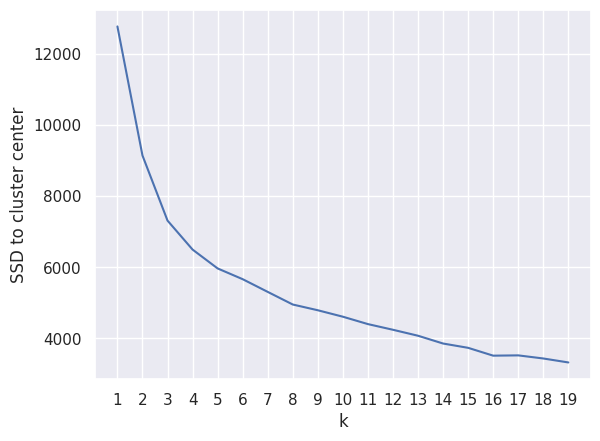

In [343]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot().
plt.plot(ks, inertias)

# define the label for x axis as 'k'
plt.xlabel('k')
# define the label for y axis as 'SSD'
plt.ylabel('SSD to cluster center')
# define the ticks in x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

### Silhuette score

In [344]:
from sklearn.metrics import silhouette_score

##setting range for possible values o k - 2 to 12
ks = range(2, 20)
sil_score = [] #Creating pretty list to store results in

for k in tqdm(ks):
#    # Create a KMeans instance with k clusters: model
   model = KMeans(n_clusters=k)

#    # Fit model to samples
   model.fit_predict(dataDemographicDF)

#    # Calculate Silhoutte Score
   sil_score.append(silhouette_score(dataDemographicDF, model.labels_, metric='euclidean'))

  0%|          | 0/18 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
  6%|▌         | 1/18 [00:00<00:15,  1.11it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 11%|█         | 2/18 [00:01<00:14,  1.09it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
 17%|█▋        | 3/18 [00:02<00:13,  1.12it/s]/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will cha

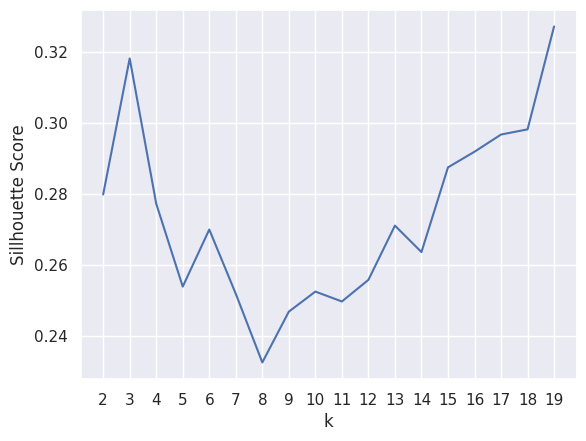

In [345]:
plt.plot(ks, sil_score)

## define the label for x axis as 'k'
plt.xlabel('k')
## define the label for y axis as 'Silhouette Score'
plt.ylabel('Sillhouette Score')
## define the ticks in x axis using the values of ks
plt.xticks(ks)
## call plt.show()
plt.show()

### Hierarchical

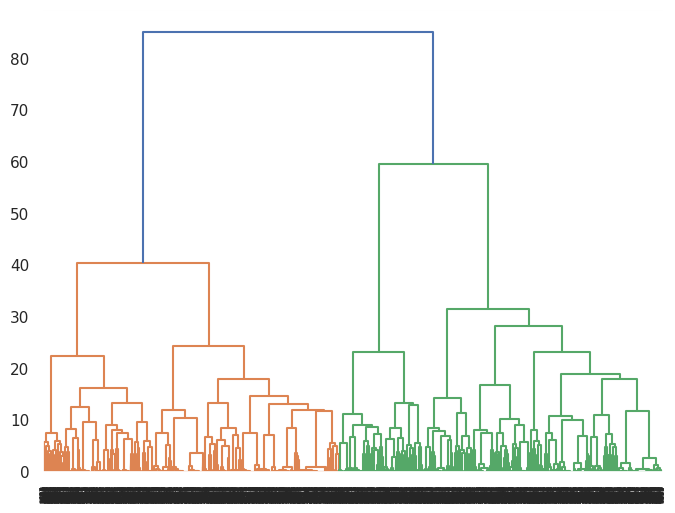

In [346]:
from scipy.cluster import hierarchy
##from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

## create clusters using the "ward method"
clusters = hierarchy.linkage(dataDemographicDF, method="ward")

## create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)
plt.show()
#plt.savefig("images/Hierarchical_results_artist_perspective.png", dpi=300)

In [347]:
kmeans_2 = KMeans(n_clusters = 3, random_state = 100).fit(dataDemographicDF)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [348]:
dataDemographicDF['label'] = kmeans_2.predict(dataDemographicDF)

<ipython-input-306-8dc2189a8ab8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


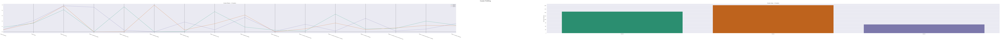

In [349]:
#profiling the cluster with the function
cluster_profiles(dataDemographicDF, ["label"], figsize=(300, 10))

  0%|          | 0/17 [00:00<?, ?it/s]

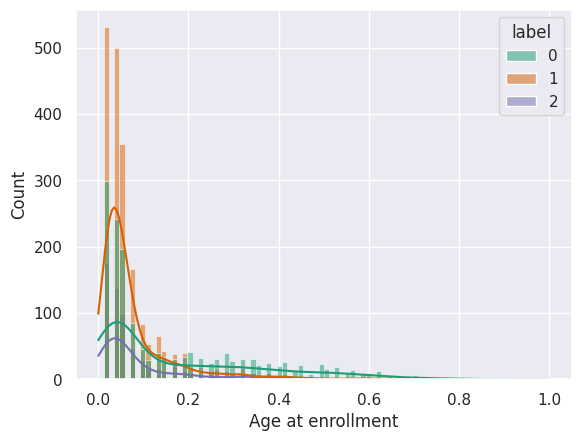

  6%|▌         | 1/17 [00:01<00:17,  1.08s/it]

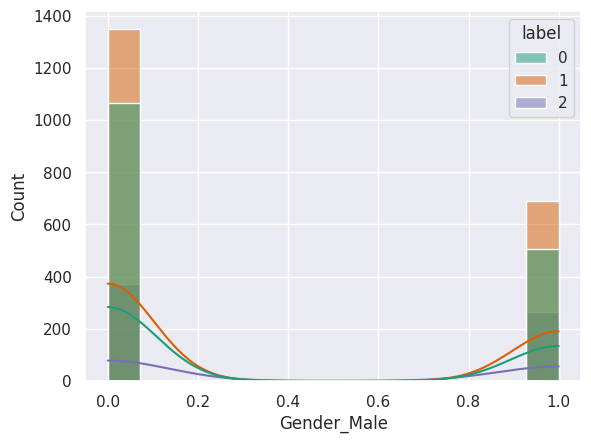

 12%|█▏        | 2/17 [00:01<00:13,  1.15it/s]

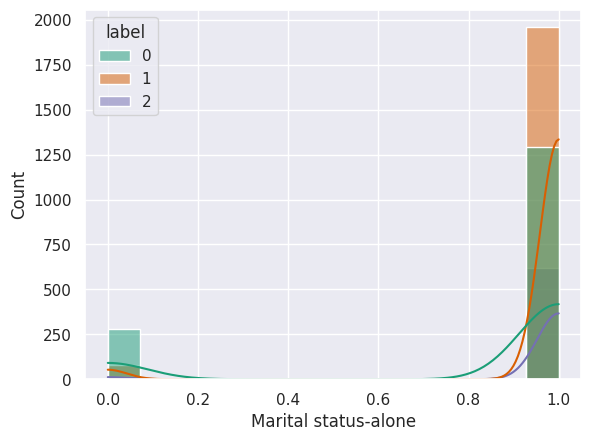

 18%|█▊        | 3/17 [00:02<00:12,  1.11it/s]

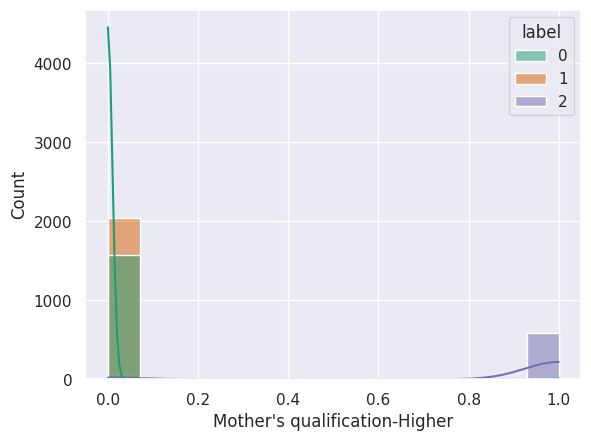

 24%|██▎       | 4/17 [00:03<00:11,  1.12it/s]

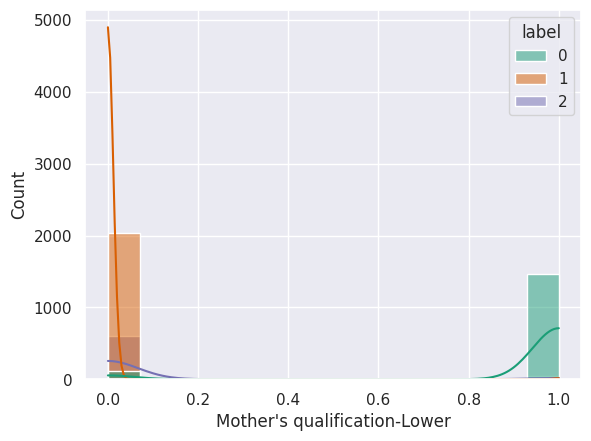

 29%|██▉       | 5/17 [00:04<00:10,  1.18it/s]

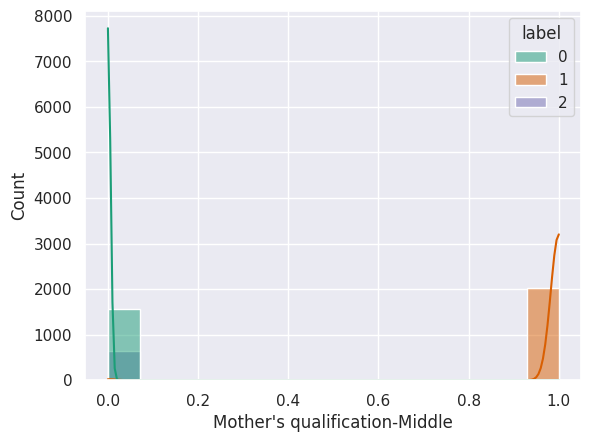

 35%|███▌      | 6/17 [00:05<00:09,  1.17it/s]

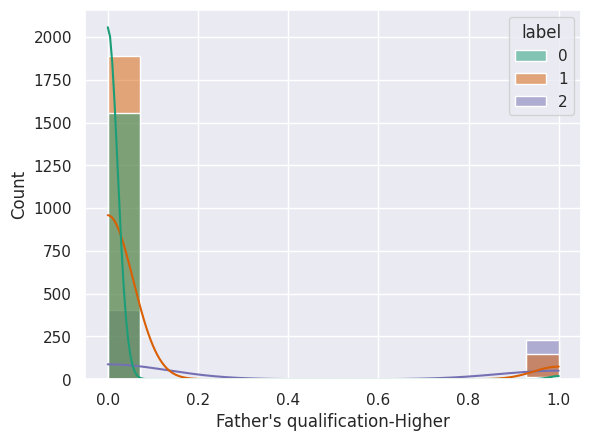

 41%|████      | 7/17 [00:06<00:08,  1.15it/s]

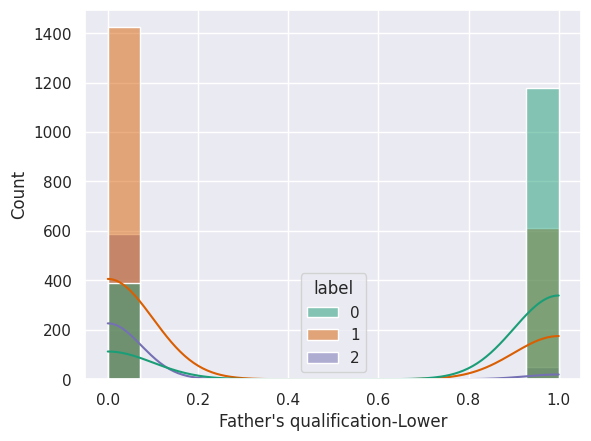

 47%|████▋     | 8/17 [00:06<00:07,  1.17it/s]

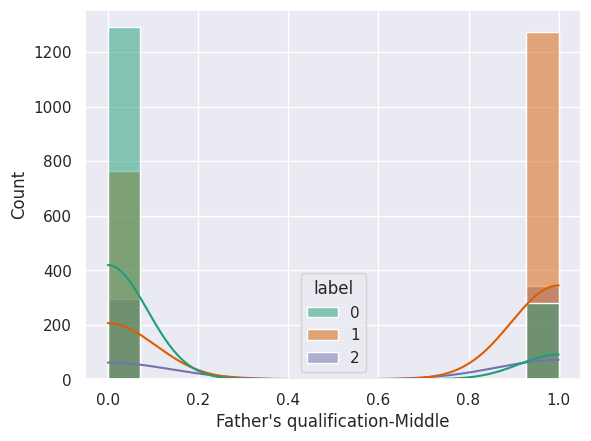

 53%|█████▎    | 9/17 [00:07<00:05,  1.34it/s]

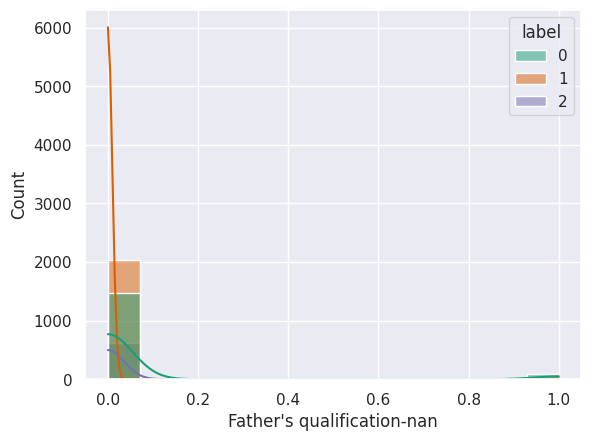

 59%|█████▉    | 10/17 [00:08<00:05,  1.40it/s]

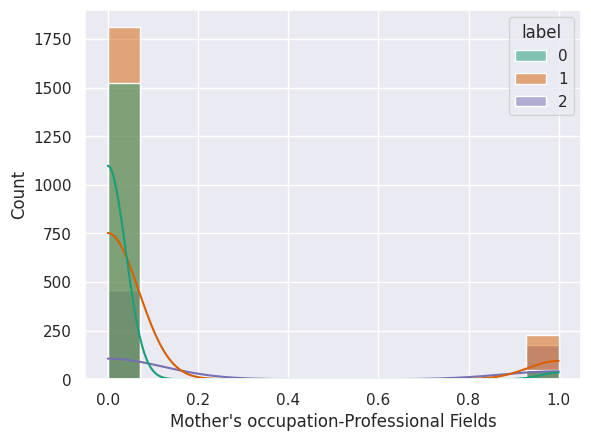

 65%|██████▍   | 11/17 [00:10<00:06,  1.08s/it]

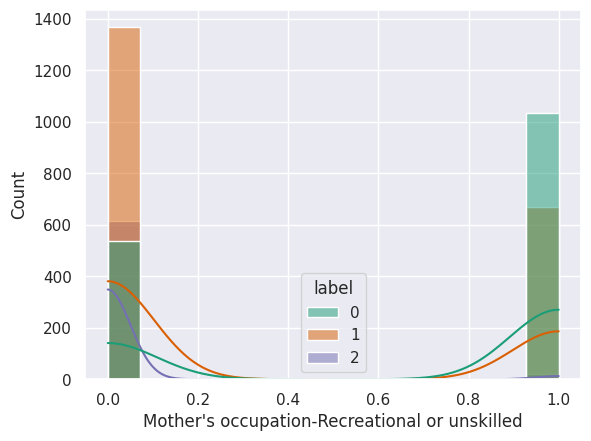

 71%|███████   | 12/17 [00:10<00:04,  1.06it/s]

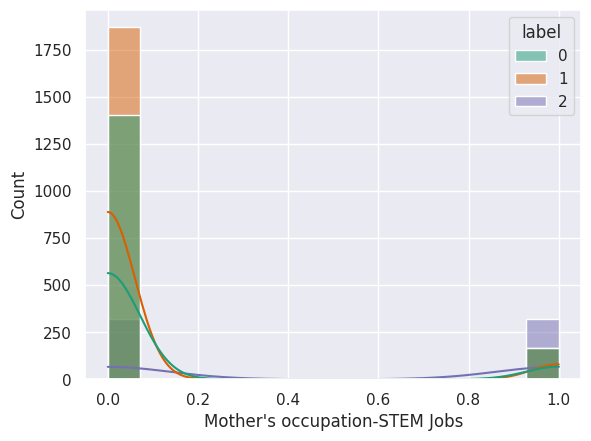

 76%|███████▋  | 13/17 [00:11<00:03,  1.19it/s]

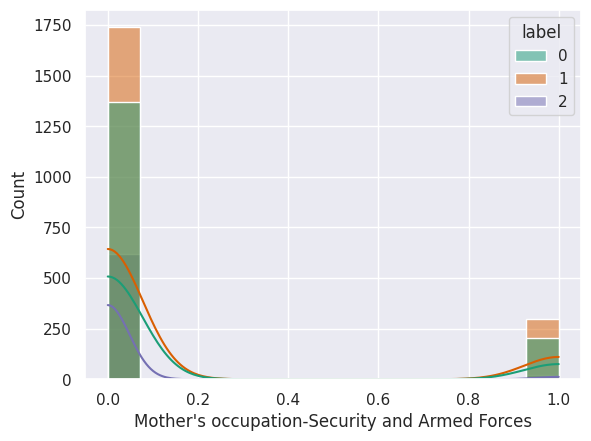

 82%|████████▏ | 14/17 [00:11<00:02,  1.30it/s]

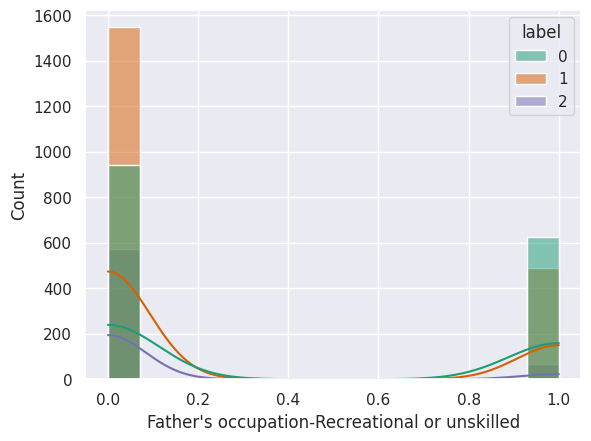

 88%|████████▊ | 15/17 [00:12<00:01,  1.39it/s]

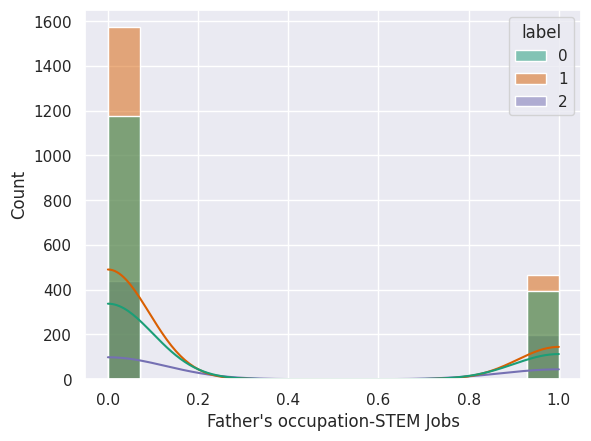

 94%|█████████▍| 16/17 [00:13<00:00,  1.48it/s]

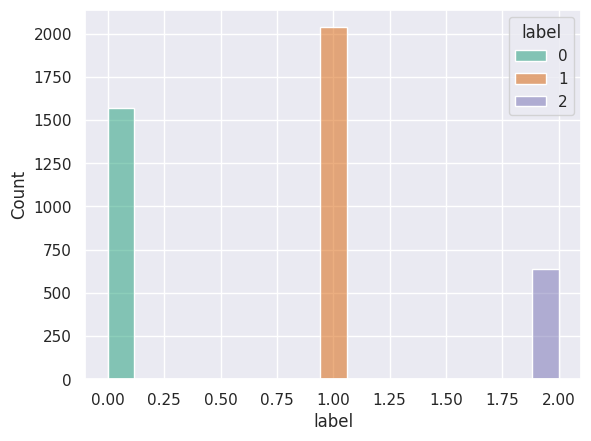

100%|██████████| 17/17 [00:13<00:00,  1.23it/s]


In [350]:
for i in tqdm(dataDemographicDF.columns):
    sns.histplot(dataDemographicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

### DF describe

In [351]:
dataDemographicDF.groupby(['label']).describe().T

label                                                          0            1  \
Age at enrollment                             count  1571.000000  2037.000000   
                                              mean      0.173030     0.077019   
                                              std       0.181699     0.088644   
                                              min       0.018868     0.000000   
                                              25%       0.037736     0.018868   
                                              50%       0.075472     0.037736   
                                              75%       0.283019     0.075472   
                                              max       1.000000     0.679245   
Gender_Male                                   count  1571.000000  2037.000000   
                                              mean      0.321451     0.337752   
                                              std       0.467182     0.473060   
                                              min       0.000000     0.000000   
                                              25%       0.000000     0.000000   
                                              50%       0.000000     0.000000   
                                              75%       1.000000     1.000000   
                                              max       1.000000     1.000000   
Marital status-alone                          count  1571.000000  2037.000000   
                                              mean      0.821133     0.961708   
                                              std       0.383363     0.191946   
                                              min       0.000000     0.000000   
                                              25%       1.000000     1.000000   
                                              50%       1.000000     1.000000   
                                              75%       1.000000     1.000000   
                                              max       1.000000     1.000000   
Mother's qualification-Higher                 count  1571.000000  2037.000000   
                                              mean      0.001910     0.000000   
                                              std       0.043671     0.000000   
                                              min       0.000000     0.000000   
                                              25%       0.000000     0.000000   
                                              50%       0.000000     0.000000   
                                              75%       0.000000     0.000000   
                                              max       1.000000     0.000000   
Mother's qualification-Lower                  count  1571.000000  2037.000000   
                                              mean      0.929981     0.002946   
                                              std       0.255260     0.054206   
                                              min       0.000000     0.000000   
                                              25%       1.000000     0.000000   
                                              50%       1.000000     0.000000   
                                              75%       1.000000     0.000000   
                                              max       1.000000     1.000000   
Mother's qualification-Middle                 count  1571.000000  2037.000000   
                                              mean      0.000637     0.993127   
                                              std       0.025230     0.082638   
                                              min       0.000000     0.000000   
                                              25%       0.000000     1.000000   
                                              50%       0.000000     1.000000   
                                              75%       0.000000     1.000000   
                                              max       1.000000     1.000000   
Father's qualification-Higher  

# Joining perspectives

In [352]:
data['academic_profile']=academicResults['label']
data['demographic_profile']=dataDemographicDF['label']

In [353]:
data['final_groups'] = data.groupby(['academic_profile', 'demographic_profile'], sort = False).ngroup()

In [354]:
unusedColumns=[s for s in data.columns if s not in dataDemographicDF.columns]
unusedColumns2=[s for s in data.columns if s not in academicData]

In [355]:
unusedColumns = set(unusedColumns)
unusedColumns2 = set(unusedColumns2)

unusedColumns.difference(unusedColumns2)
unusedColumns2.difference(unusedColumns)

usedColumnsAll=unusedColumns.difference(unusedColumns2).union(unusedColumns2.difference(unusedColumns))
usedColumnsAll

unusedColumnsAll=set(data.columns.difference(usedColumnsAll))
unusedColumnsAll

{'Application mode',
 'Application order',
 'Average grade 1st period',
 'Average grade 2nd period',
 'Average units credited',
 'Average unscored units',
 'Course-Advertising and Marketing Management',
 'Course-Agronomy',
 'Course-Animation and Multimedia Design',
 'Course-Basic Education',
 'Course-Biofuel Production Technologies',
 'Course-Communication Design',
 'Course-Equinculture',
 'Course-Informatics Engineering',
 'Course-Journalism and Communication',
 'Course-Management',
 'Course-Management (evening attendance)',
 'Course-Nursing',
 'Course-Oral Hygiene',
 'Course-Social Service',
 'Course-Social Service (evening attendance)',
 'Course-Tourism',
 'Course-Veterinary Nursing',
 'Course-nan',
 'Debtor',
 'Displaced',
 'External Funding',
 "Father's occupation-Professional Fields",
 "Father's occupation-Security and Armed Forces",
 "Father's occupation-Service Industry",
 "Father's occupation-Technical and Skilled Trades",
 "Father's occupation-White collar Jobs",
 "Father's o

In [356]:
unusedColumnsAll.remove('final_groups')

In [357]:
profiling_df=data.copy().drop(unusedColumnsAll,axis=1)

<ipython-input-306-8dc2189a8ab8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:19: UserWarning: 
The palette list has fewer values (8) than needed (9) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
<ipython-input-306-8dc2189a8ab8>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


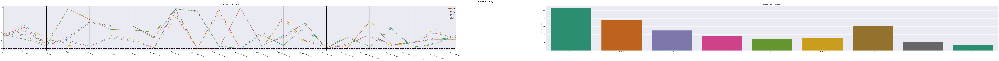

In [358]:
cluster_profiles(profiling_df, ["final_groups"], figsize=(200, 10))

  0%|          | 0/22 [00:00<?, ?it/s]

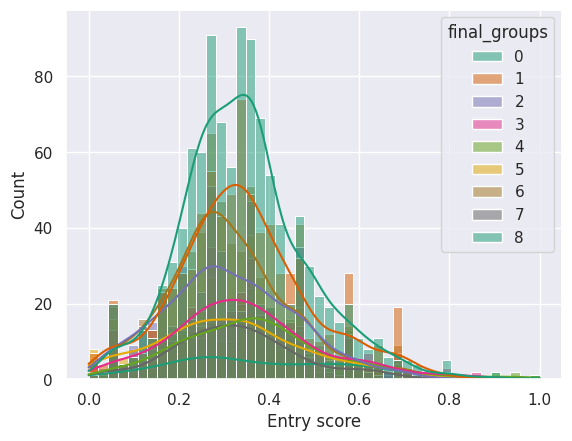

  5%|▍         | 1/22 [00:02<00:44,  2.11s/it]

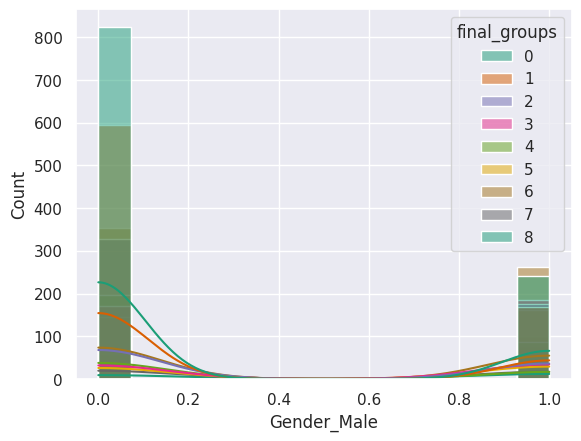

  9%|▉         | 2/22 [00:03<00:29,  1.50s/it]

In [ ]:
for i in tqdm(profiling_df.drop('final_groups', axis = 1).columns):
    sns.histplot(profiling_df, x = i, hue='final_groups', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [ ]:
profiling_df.groupby(['final_groups']).describe().T